##Import Libraries##

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from collections import Counter
from datetime import datetime
from sklearn.impute import SimpleImputer
from geopy.distance import geodesic
from sklearn.neighbors import BallTree
import folium
from folium.plugins import HeatMap
import plotly.offline as pyo
import plotly.graph_objs as go
from wordcloud import WordCloud

##Load Dataset##

In [2]:
Melbourne = pd.read_csv("/content/MelbourneListings.csv")

##Initial Exploratory Data Analysis##

In [4]:
print(Melbourne.info())
print(Melbourne.describe())
print(Melbourne['last_scraped'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25946 entries, 0 to 25945
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            25946 non-null  int64  
 1   listing_url                                   25946 non-null  object 
 2   scrape_id                                     25946 non-null  int64  
 3   last_scraped                                  25946 non-null  object 
 4   source                                        25946 non-null  object 
 5   name                                          25946 non-null  object 
 6   description                                   25381 non-null  object 
 7   neighborhood_overview                         12307 non-null  object 
 8   picture_url                                   25946 non-null  object 
 9   host_id                                       25946 non-null 

##Data Cleaning##

In [5]:
print("--- Initial Dataset Information ---")
print(Melbourne.info())

print("\n--- Initial Descriptive Statistics ---")
print(Melbourne.describe())

# Drop mostly null columns and specific irrelevant columns
print("\n--- Dropping Columns with High Null Percentage ---")
# First, let's calculate the percentage of null values in each column
null_percentage = Melbourne.isnull().mean() * 100

# Set a threshold for "mostly null"
threshold = 90

# Get columns that are above the threshold or entirely null
columns_to_drop = null_percentage[null_percentage >= threshold].index.tolist()

# Drop these columns from the DataFrame
Melbourne1 = Melbourne.drop(columns=columns_to_drop)

specific_columns = ['calendar_updated', 'neighbourhood_group_cleansed', 'license']
Melbourne1 = Melbourne1.drop(columns=[col for col in specific_columns if col in Melbourne1.columns])

# Print the columns that were dropped
print(f"Dropped columns: {columns_to_drop + [col for col in specific_columns if col in Melbourne.columns]}")

print("\n--- DataFrame Info After Initial Column Dropping ---")
print(Melbourne1.info())

--- Initial Dataset Information ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25946 entries, 0 to 25945
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            25946 non-null  int64  
 1   listing_url                                   25946 non-null  object 
 2   scrape_id                                     25946 non-null  int64  
 3   last_scraped                                  25946 non-null  object 
 4   source                                        25946 non-null  object 
 5   name                                          25946 non-null  object 
 6   description                                   25381 non-null  object 
 7   neighborhood_overview                         12307 non-null  object 
 8   picture_url                                   25946 non-null  object 
 9   host_id                  

##Data Cleaning: Feature Selection##


--- DataFrame Info After Selecting Relevant Columns ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25946 entries, 0 to 25945
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              25946 non-null  int64  
 1   name                            25946 non-null  object 
 2   host_id                         25946 non-null  int64  
 3   host_name                       25936 non-null  object 
 4   host_since                      25936 non-null  object 
 5   host_is_superhost               24971 non-null  object 
 6   neighbourhood                   12308 non-null  object 
 7   host_neighbourhood              7750 non-null   object 
 8   host_total_listings_count       25936 non-null  float64
 9   latitude                        25946 non-null  float64
 10  longitude                       25946 non-null  float64
 11  property_type                   2594

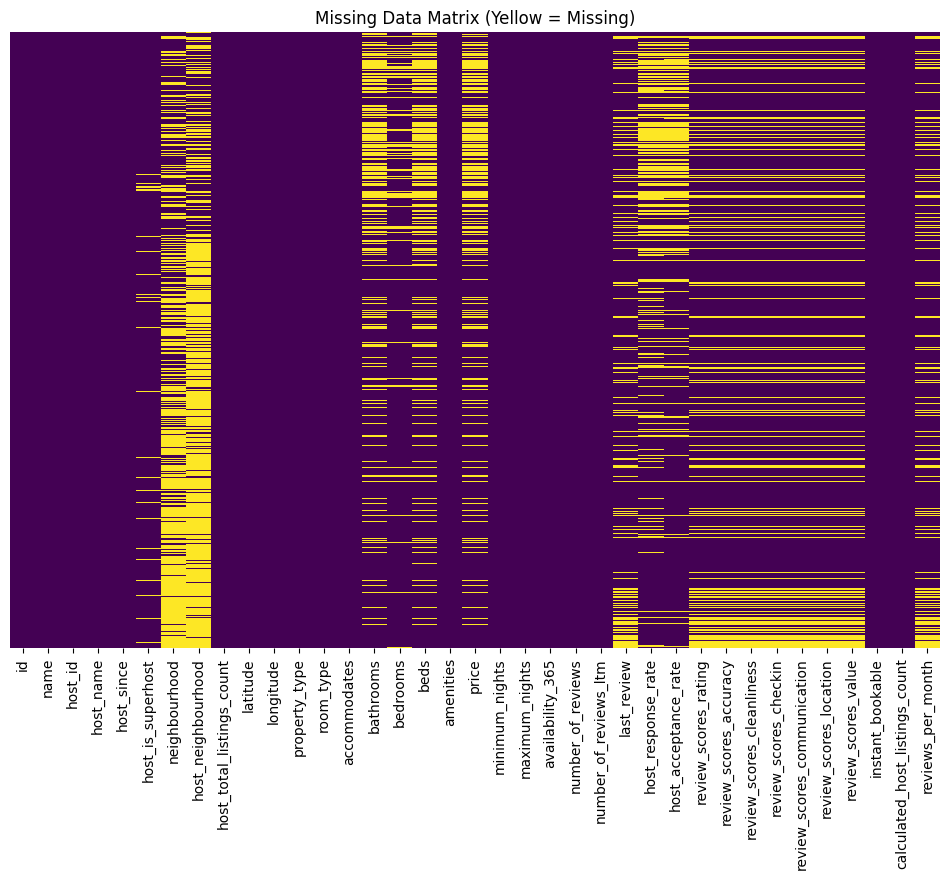

In [6]:
"""Keep relevant variables"""

# List of relevant columns for price modeling
relevant_columns = [
    'id', 'name', 'host_id', 'host_name', 'host_since', 'host_is_superhost', 'neighbourhood', 'host_neighbourhood', 'host_total_listings_count', 'latitude', 'longitude', 'property_type',
    'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'availability_365',
    'number_of_reviews', 'number_of_reviews_ltm', 'last_review', 'host_response_rate', 'host_acceptance_rate', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value', 'instant_bookable', 'calculated_host_listings_count', 'reviews_per_month'
]

# Filter the dataframe
Melbourne1 = Melbourne1[relevant_columns].copy()

print("\n--- DataFrame Info After Selecting Relevant Columns ---")
Melbourne1.info()

print("\nLast Scraped Column (from original Melbourne DataFrame):")
print(Melbourne['last_scraped'])

# Calculate missing values
missing = Melbourne1.isnull().sum()
missing_percent = (missing / len(Melbourne1)) * 100

print("\n--- Missing Value Summary (Before Imputation) ---")
print(pd.DataFrame({'Missing Count': missing, 'Missing Percentage': missing_percent}).sort_values('Missing Count', ascending=False))

# Create a missing data matrix
plt.figure(figsize=(12, 8))
sns.heatmap(Melbourne1.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Data Matrix (Yellow = Missing)')
plt.xticks(rotation=90)
plt.show()

##Data Cleaning: Type Conversion and Initial Formatting##

In [7]:
# Convert price to numeric (remove $ and commas)
Melbourne1['price'] = Melbourne1['price'].str.replace('[$,]', '', regex=True).astype(float)
print("\n--- Price Column Head (After Cleaning) ---")
print(Melbourne1['price'].head())

# Drop Price NA value
Melbourne1.dropna(subset=['price'], inplace=True)
print("\n--- Price Column Head (After Dropping NA) ---")
print(Melbourne1['price'].head())
print("\n--- Price Descriptive Statistics (After Cleaning) ---")
print(Melbourne1['price'].describe())

# ===== Drop NaN values in host_since =====
print("\n--- Before Dropping host_since NA Values ---")
print(f"Total rows: {len(Melbourne1)}")
print(f"Missing host_since: {Melbourne1['host_since'].isna().sum()}")

Melbourne1.dropna(subset=['host_since'], inplace=True)

print("\n--- After Dropping host_since NA Values ---")
print(f"Remaining rows: {len(Melbourne1)}")
print(f"Earliest host since: {Melbourne1['host_since'].min()}")
print(f"Latest host since: {Melbourne1['host_since'].max()}")

# Convert boolean columns
Melbourne1['host_is_superhost'] = Melbourne1['host_is_superhost'].map({'t': 1, 'f': 0})
Melbourne1['instant_bookable'] = Melbourne1['instant_bookable'].map({'t': 1, 'f': 0})

print("\n--- Superhost Status Descriptive Statistics ---")
print(Melbourne1['host_is_superhost'].describe())
print("\n--- Instant Bookable Status Descriptive Statistics ---")
print(Melbourne1['instant_bookable'].describe())

# Convert date columns
Melbourne1['host_since'] = pd.to_datetime(Melbourne1['host_since'])
Melbourne1['last_review'] = pd.to_datetime(Melbourne1['last_review'])

# Extract year from host_since for analysis
Melbourne1['year'] = Melbourne1['host_since'].dt.year

# Summary statistics for numerical columns
num_cols = Melbourne1.select_dtypes(include=['int64', 'float64']).columns
print("\n--- Descriptive Statistics for Numerical Columns (after initial cleaning) ---")
print(Melbourne1[num_cols].describe())


--- Price Column Head (After Cleaning) ---
0     55.0
1      NaN
2      NaN
3    139.0
4     79.0
Name: price, dtype: float64

--- Price Column Head (After Dropping NA) ---
0     55.0
3    139.0
4     79.0
6    252.0
8     70.0
Name: price, dtype: float64

--- Price Descriptive Statistics (After Cleaning) ---
count     18627.000000
mean        251.347023
std        1239.041679
min          17.000000
25%         118.000000
50%         170.000000
75%         250.000000
max      103933.000000
Name: price, dtype: float64

--- Before Dropping host_since NA Values ---
Total rows: 18627
Missing host_since: 8

--- After Dropping host_since NA Values ---
Remaining rows: 18619
Earliest host since: 2009-05-25
Latest host since: 2025-03-01

--- Superhost Status Descriptive Statistics ---
count    17786.000000
mean         0.369841
std          0.482775
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: host_is_superhost, dtype: floa

##Visualizations Univariate Analysis##


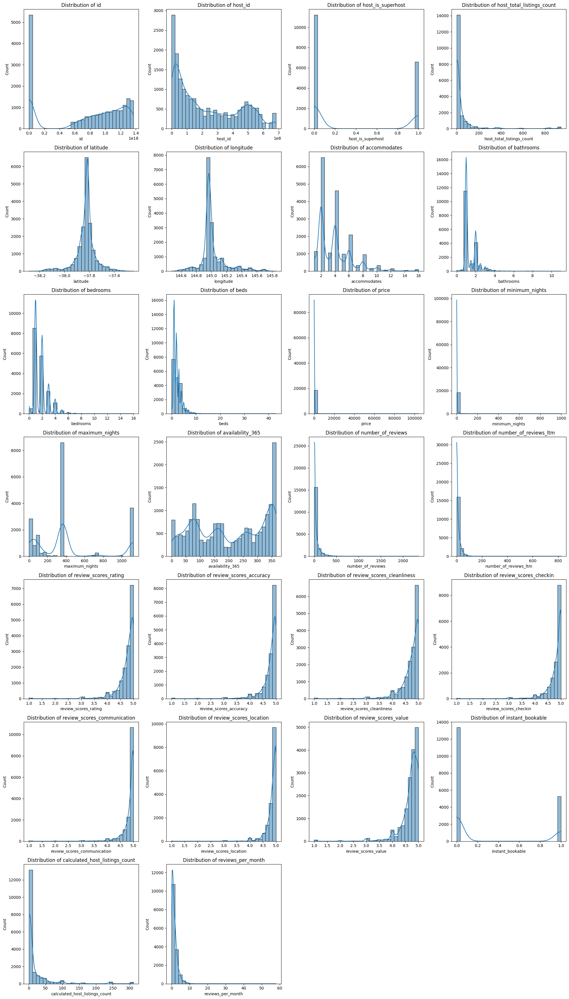

/tmp/ipython-input-8-876832230.py:35: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 22696 (\N{CJK UNIFIED IDEOGRAPH-58A8}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 23572 (\N{CJK UNIFIED IDEOGRAPH-5C14}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 26412 (\N{CJK UNIFIED IDEOGRAPH-672C}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 29420 (\N{CJK UNIFIED IDEOGRAPH-72EC}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 31435 (\N{CJK UNIFIED IDEOGRAPH-7ACB}) missing from font(s) DejaVu Sans.


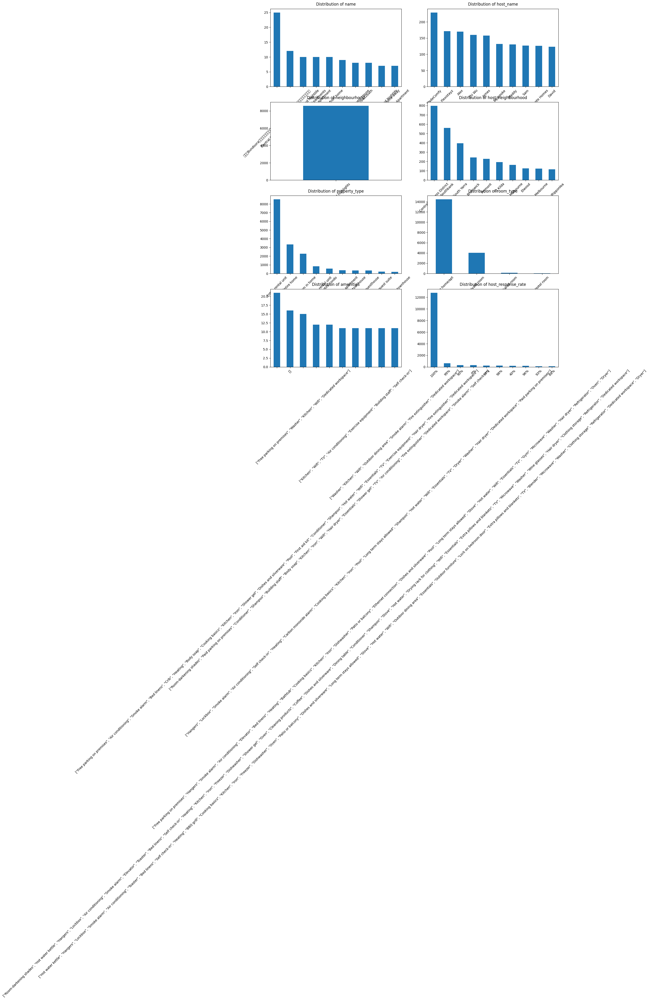

In [8]:
# Get numerical columns (int and float)
num_cols = Melbourne1.select_dtypes(include=['int64', 'float64']).columns
n_cols = len(num_cols)

# Calculate grid size dynamically
n_rows = (n_cols // 4) + (1 if n_cols % 4 != 0 else 0)  # 4 columns per row

plt.figure(figsize=(20, 5 * n_rows))  # Adjust height based on rows
for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, 4, i)
    sns.histplot(data=Melbourne1, x=col, bins=30, kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Visualization for categorical variables
# Identify categorical columns
cat_cols = Melbourne1.select_dtypes(include=['object', 'category']).columns.tolist()

# Now create the visualization
plt.figure(figsize=(16, 20))
for i, col in enumerate(cat_cols[:8]):  # First 8 categorical columns
    plt.subplot(4, 2, i+1)

    # For high cardinality columns (many unique values), show just top 10
    if Melbourne1[col].nunique() > 10:
        Melbourne1[col].value_counts().head(10).plot(kind='bar')
    else:
        Melbourne1[col].value_counts().plot(kind='bar')

    plt.title(f'Distribution of {col}', pad=10)
    plt.xticks(rotation=45)
    plt.xlabel('')

plt.tight_layout()
plt.show()

##Bivariate Analysis and Price Exploration##


--- Price Percentiles ---
count     18619.000000
mean        251.349911
std        1239.305332
min          17.000000
1%           40.000000
5%           58.000000
25%         118.000000
50%         170.000000
75%         250.000000
95%         550.000000
99%        1260.000000
max      103933.000000
Name: price, dtype: float64


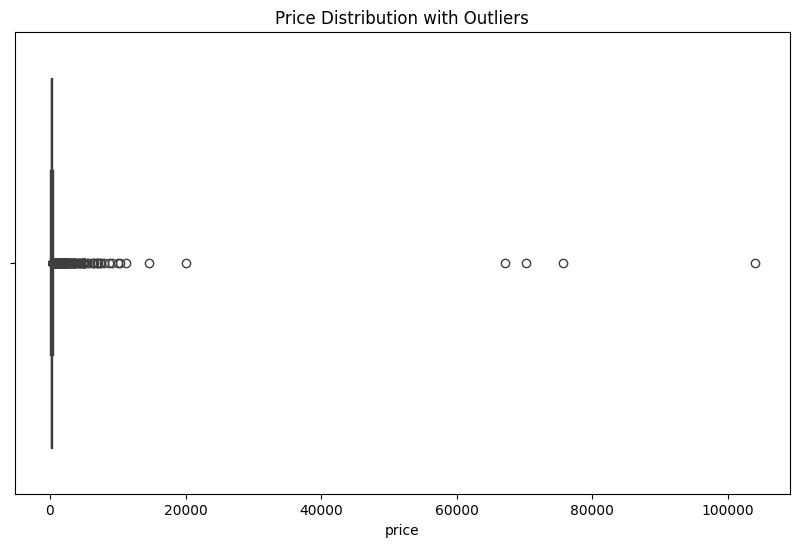

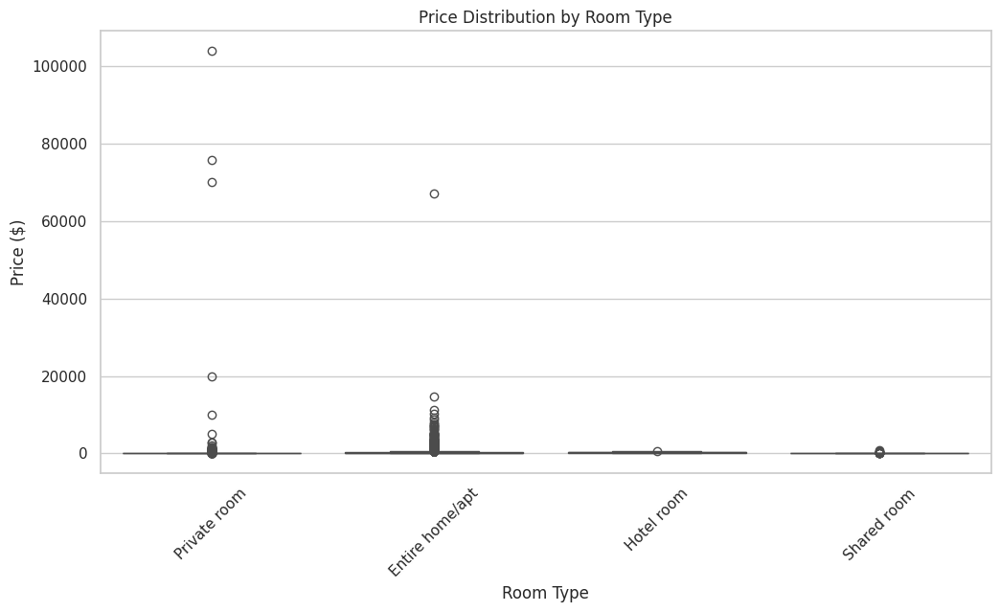

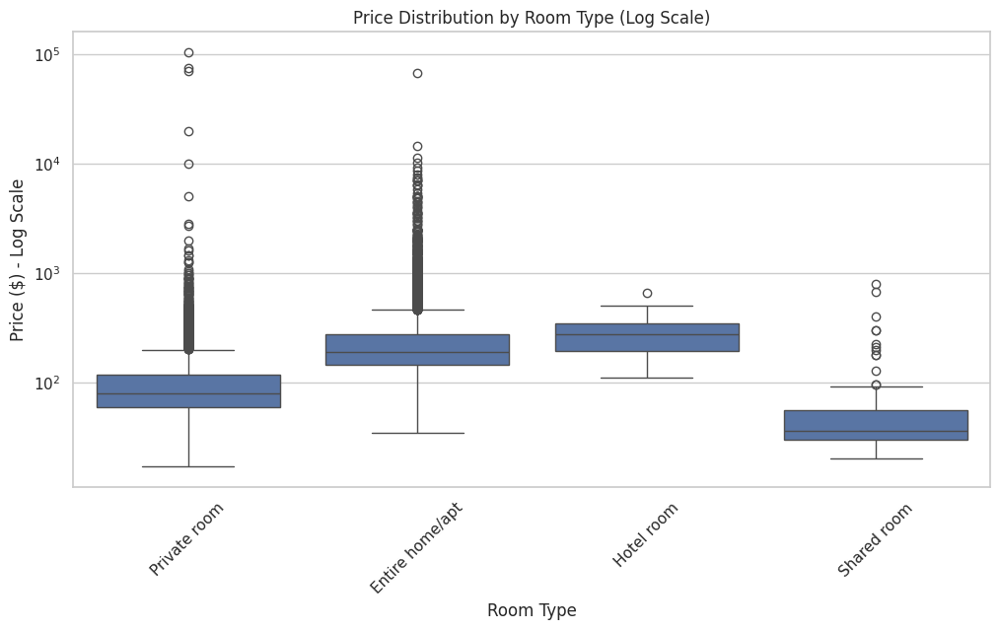

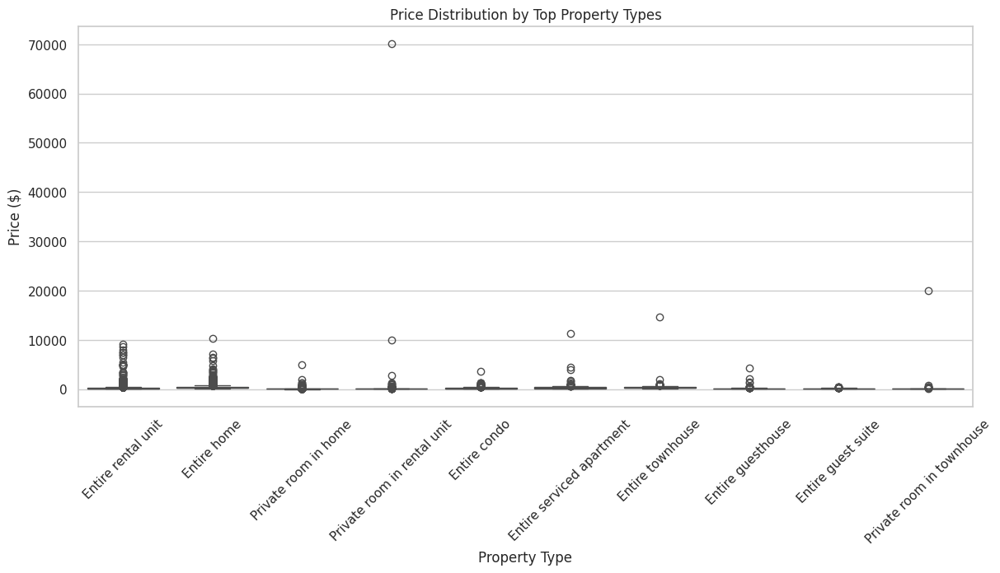

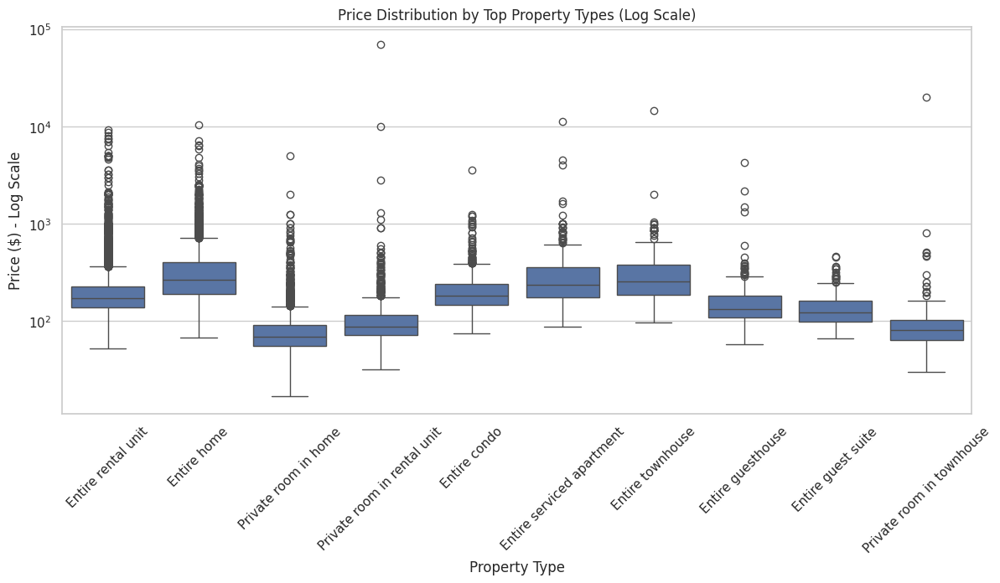

/tmp/ipython-input-9-2001045810.py:70: FutureWarning:

The provided callable <function median at 0x7c1775f2b6a0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.



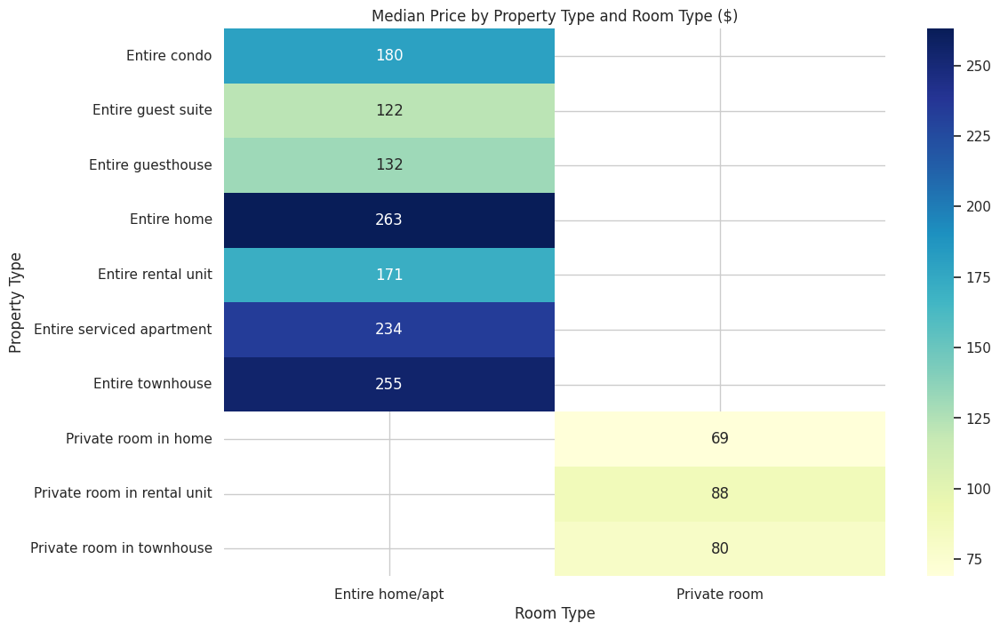


--- Formatted Price Table by Year and Room Type (Avg/Median) ---


,Year,Avg Price (Entire Home),Avg Price (Private Room),Avg Price (Shared Room),Median Price (Entire Home),Median Price (Private Room),Median Price (Shared Room)
0,2009,$182.29,$92.00,$0.00,$131.00,$92.00,$0.00
1,2010,$310.58,$79.82,$0.00,$148.00,$79.00,$0.00
2,2011,$270.03,$99.33,$0.00,$225.00,$84.00,$0.00
3,2012,$264.11,$260.20,$0.00,$191.00,$115.00,$0.00
4,2013,$284.88,$258.42,$0.00,$206.00,$86.00,$0.00
5,2014,$300.13,$103.66,$264.00,$193.00,$81.00,$264.00
6,2015,$318.26,$266.04,$54.50,$190.00,$81.00,$54.50
7,2016,$262.70,$221.30,$552.33,$194.00,$72.00,$679.00
8,2017,$257.03,$116.93,$66.67,$182.00,$80.00,$58.00
9,2018,$302.06,$433.35,$0.00,$190.00,$77.00,$0.00



--- Detailed Price Table by Year and Room Type (Min/Max/Avg/Median) ---


/tmp/ipython-input-9-2001045810.py:168: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

/tmp/ipython-input-9-2001045810.py:168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,Min (Entire),Min (Private),Min (Shared),Max (Entire),Max (Private),Max (Shared),Avg (Entire),Avg (Private),Avg (Shared),Median (Entire),Median (Private),Median (Shared)
0,2009,$92.00,$55.00,$0.00,$517.00,$129.00,$0.00,$182.29,$92.00,$0.00,$131.00,$92.00,$0.00
1,2010,$75.00,$50.00,$0.00,"$5,000.00",$126.00,$0.00,$310.58,$79.82,$0.00,$148.00,$79.00,$0.00
2,2011,$86.00,$43.00,$0.00,"$1,650.00",$512.00,$0.00,$270.03,$99.33,$0.00,$225.00,$84.00,$0.00
3,2012,$67.00,$36.00,$0.00,"$5,000.00","$1,629.00",$0.00,$264.11,$260.20,$0.00,$191.00,$115.00,$0.00
4,2013,$68.00,$33.00,$0.00,"$2,700.00","$20,000.00",$0.00,$284.88,$258.42,$0.00,$206.00,$86.00,$0.00
5,2014,$59.00,$28.00,$128.00,"$7,071.00",$904.00,$400.00,$300.13,$103.66,$264.00,$193.00,$81.00,$264.00
6,2015,$59.00,$32.00,$45.00,"$67,150.00","$70,222.00",$64.00,$318.26,$266.04,$54.50,$190.00,$81.00,$54.50
7,2016,$35.00,$27.00,$179.00,"$7,399.00","$75,714.00",$799.00,$262.70,$221.30,$552.33,$194.00,$72.00,$679.00
8,2017,$55.00,$23.00,$55.00,"$9,180.00","$1,457.00",$87.00,$257.03,$116.93,$66.67,$182.00,$80.00,$58.00
9,2018,$58.00,$17.00,$0.00,"$14,649.00","$103,933.00",$0.00,$302.06,$433.35,$0.00,$190.00,$77.00,$0.00


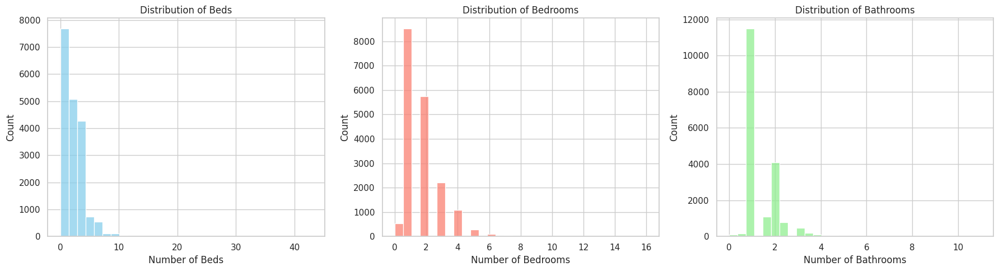

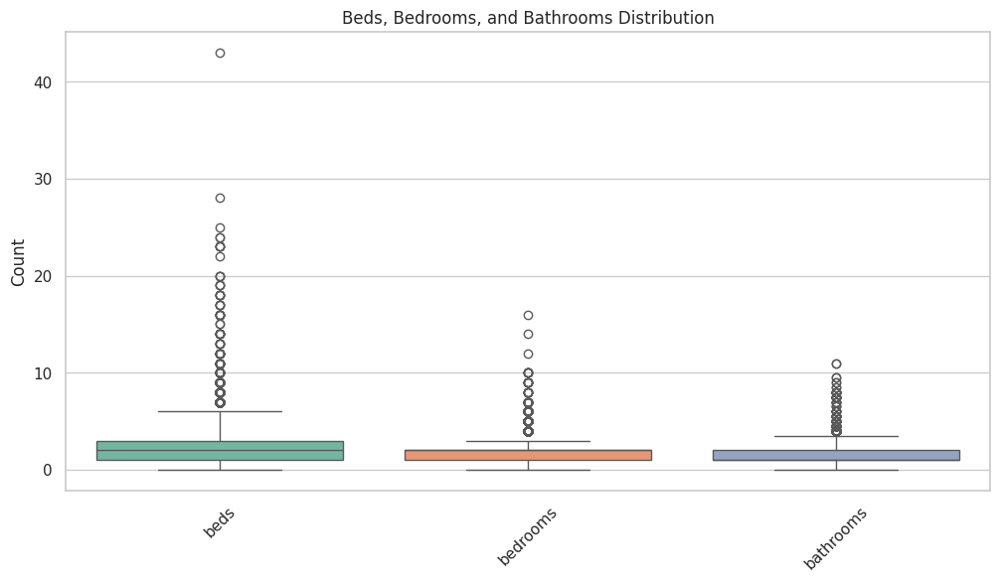

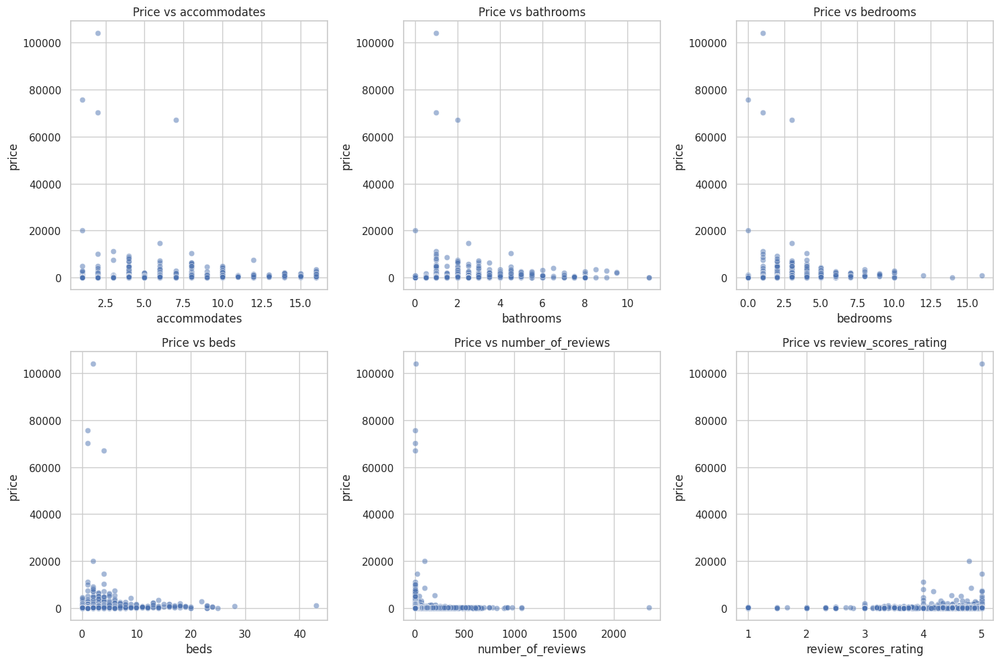


--- Correlation Matrix of Numerical Features ---


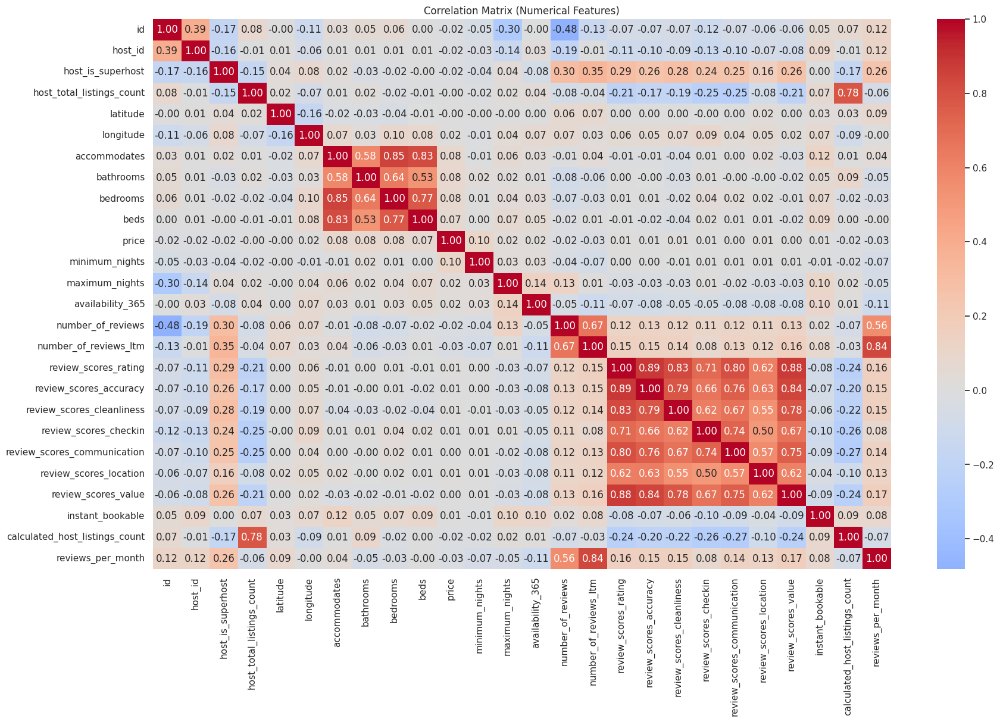


--- Top features correlated with price ---
price                             1.000000
minimum_nights                    0.103158
bathrooms                         0.083560
bedrooms                          0.079643
accommodates                      0.078809
beds                              0.070917
maximum_nights                    0.022327
availability_365                  0.020574
longitude                         0.015316
review_scores_location            0.014191
review_scores_rating              0.012601
review_scores_cleanliness         0.012535
review_scores_accuracy            0.009431
review_scores_checkin             0.008060
instant_bookable                  0.006426
review_scores_communication       0.004358
review_scores_value               0.002008
host_total_listings_count        -0.000990
latitude                         -0.001373
id                               -0.015230
calculated_host_listings_count   -0.016315
host_id                          -0.019409
host_is_su

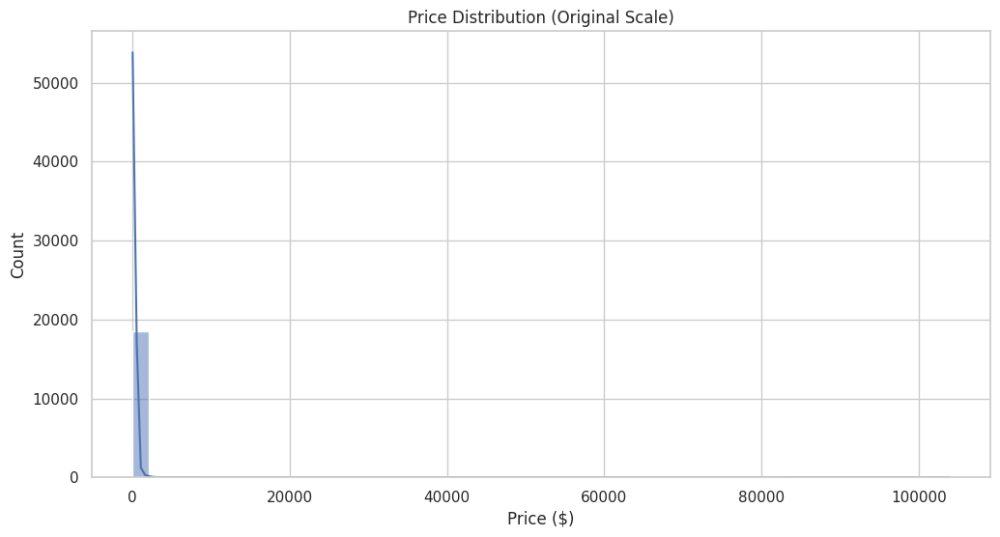

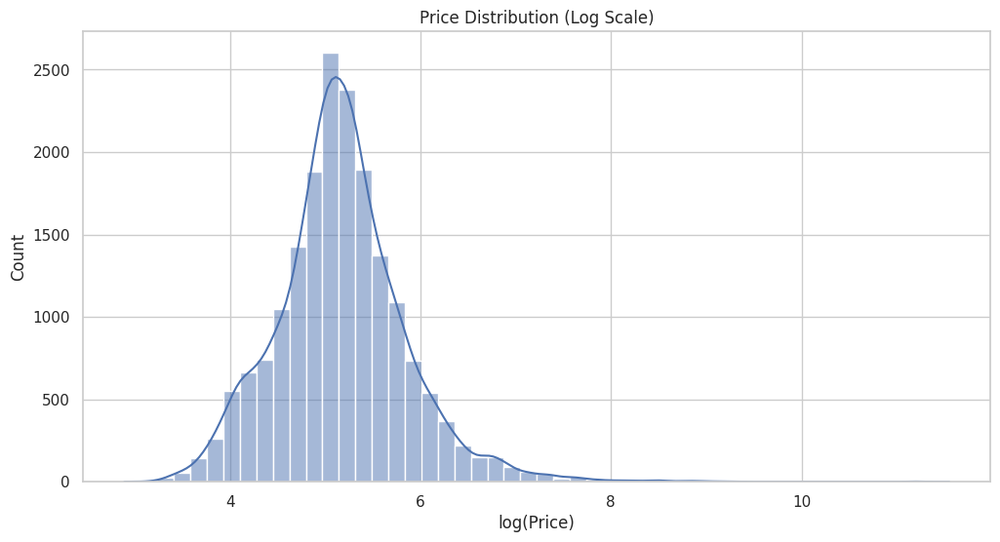

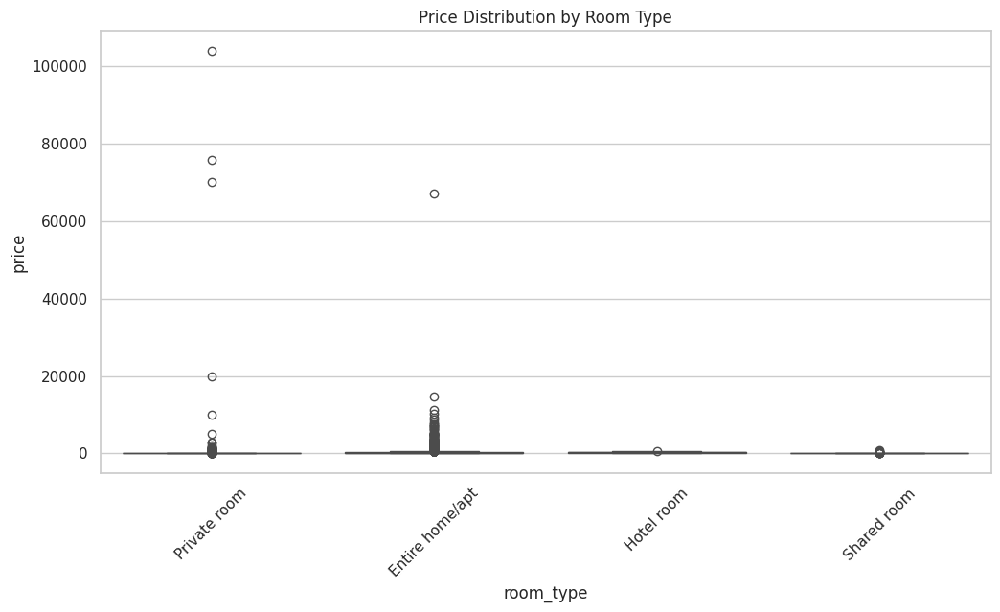

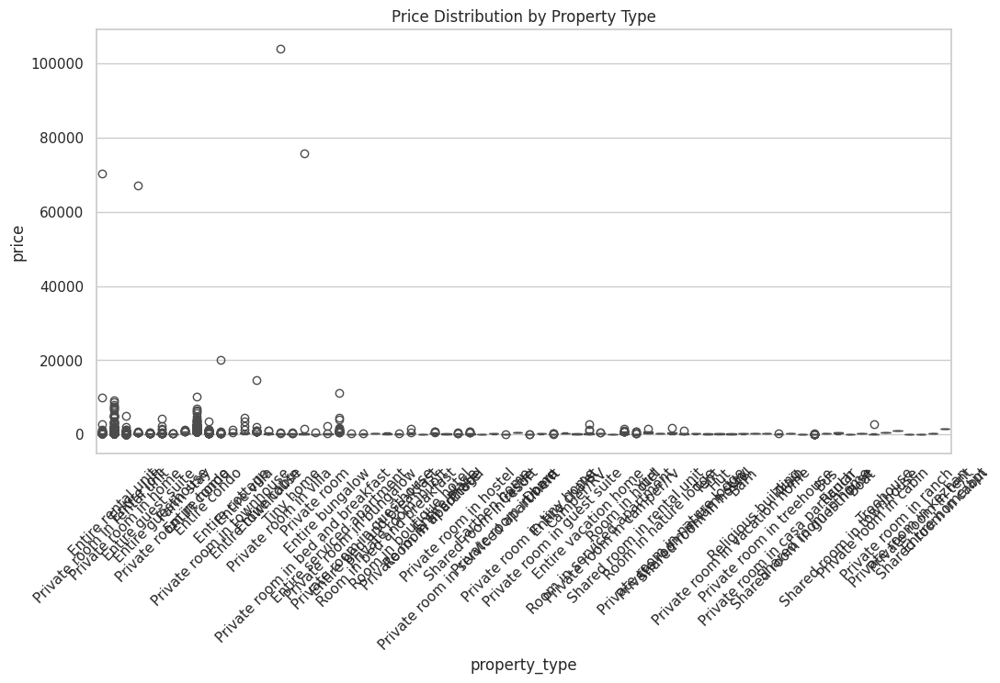

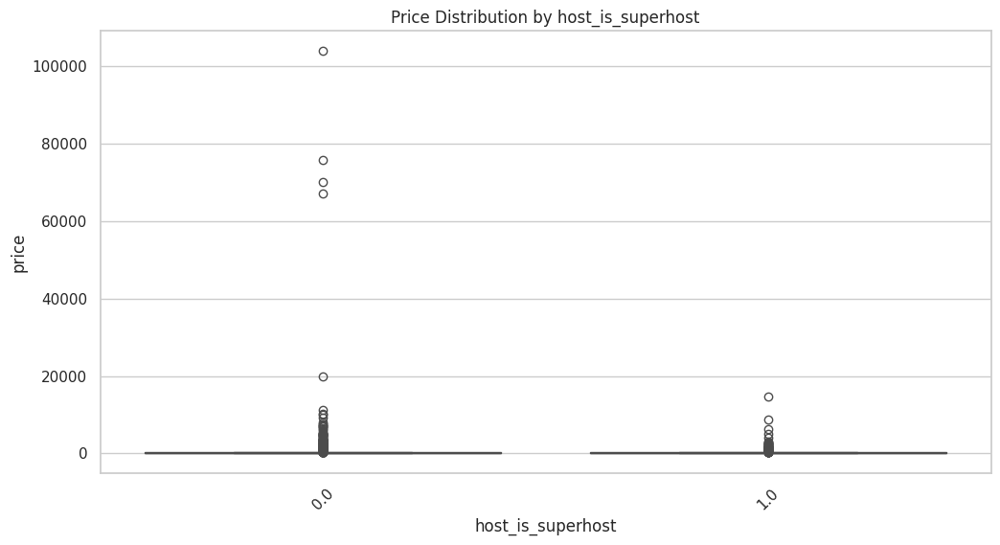

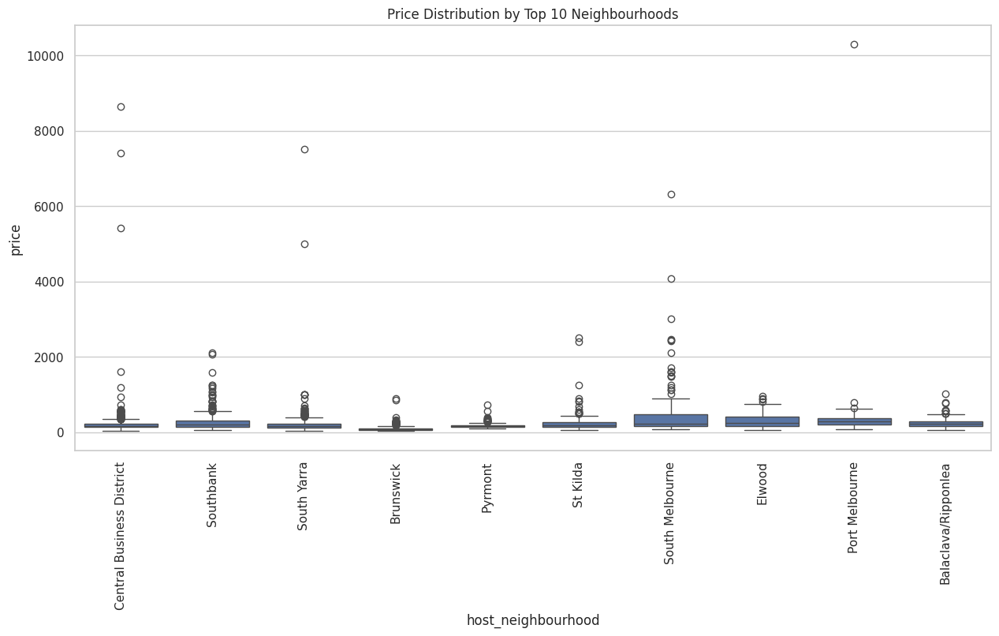

In [9]:
"""Bivariate Analysis"""

# Calculate key percentiles for price
price_stats = Melbourne1['price'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
print("\n--- Price Percentiles ---")
print(price_stats)

# Visualize price distribution with outliers
plt.figure(figsize=(10, 6))
sns.boxplot(x=Melbourne1['price'])
plt.title('Price Distribution with Outliers')
plt.show()

# Set style for better visuals
sns.set(style="whitegrid")

# Price Distribution by Room Type
plt.figure(figsize=(12, 6))
sns.boxplot(x='room_type', y='price', data=Melbourne1)
plt.title('Price Distribution by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Room Type (Log Scale)
plt.figure(figsize=(12, 6))
sns.boxplot(x='room_type', y='price', data=Melbourne1)
plt.yscale('log')  # Log scale to better visualize wide price ranges
plt.title('Price Distribution by Room Type (Log Scale)')
plt.xlabel('Room Type')
plt.ylabel('Price ($) - Log Scale')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Top Property Types
# Get top N property types by count (adjust number as needed)
top_properties = Melbourne1['property_type'].value_counts().nlargest(10).index

plt.figure(figsize=(14, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Melbourne1[Melbourne1['property_type'].isin(top_properties)],
    order=top_properties
)
plt.title('Price Distribution by Top Property Types')
plt.xlabel('Property Type')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Top Property Types (Log Scale)
plt.figure(figsize=(14, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Melbourne1[Melbourne1['property_type'].isin(top_properties)],
    order=top_properties
)
plt.yscale('log')
plt.title('Price Distribution by Top Property Types (Log Scale)')
plt.xlabel('Property Type')
plt.ylabel('Price ($) - Log Scale')
plt.xticks(rotation=45)
plt.show()

# Average Price by Room and Property Type (Heatmap)
# Create a cross-tabulation of average prices
cross_tab = pd.pivot_table(
    Melbourne1[Melbourne1['property_type'].isin(top_properties)],
    values='price',
    index='property_type',
    columns='room_type',
    aggfunc=np.median
)

plt.figure(figsize=(12, 8))
sns.heatmap(cross_tab, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title('Median Price by Property Type and Room Type ($)')
plt.xlabel('Room Type')
plt.ylabel('Property Type')
plt.show()

# Create the summary table
price_summary = Melbourne1.groupby(['year', 'room_type']).agg(
    Listings_Count=('id', 'count'),
    Avg_Price=('price', 'mean'),
    Median_Price=('price', 'median')
).reset_index()

# Pivot to get room types as columns
pivoted_price = price_summary.pivot_table(
    index='year',
    columns='room_type',
    values=['Avg_Price', 'Median_Price'],
    fill_value=0
)

# Flatten multi-index columns
pivoted_price.columns = [f"{col[1]}_{col[0]}" for col in pivoted_price.columns]
pivoted_price.reset_index(inplace=True)

# Format the table for display
formatted_price_table = pivoted_price.copy()
formatted_price_table['Year'] = formatted_price_table['year']
formatted_price_table = formatted_price_table[[
    'Year',
    'Entire home/apt_Avg_Price', 'Private room_Avg_Price', 'Shared room_Avg_Price',
    'Entire home/apt_Median_Price', 'Private room_Median_Price', 'Shared room_Median_Price'
]]

# Rename columns to match your requested format
formatted_price_table.columns = [
    'Year',
    'Avg Price (Entire Home)', 'Avg Price (Private Room)', 'Avg Price (Shared Room)',
    'Median Price (Entire Home)', 'Median Price (Private Room)', 'Median Price (Shared Room)'
]

# Apply currency formatting
for col in formatted_price_table.columns[1:]:
    formatted_price_table[col] = formatted_price_table[col].apply(lambda x: f"${x:,.2f}")

print("\n--- Formatted Price Table by Year and Room Type (Avg/Median) ---")
display(formatted_price_table)

# Create summary statistics
price_stats_detailed = Melbourne1.groupby(['year', 'room_type'])['price'].agg(
    Listings_Count='count',
    Min_Price='min',
    Max_Price='max',
    Avg_Price='mean',
    Median_Price='median'
).reset_index()

# Pivot to get room types as columns
pivoted_stats = price_stats_detailed.pivot_table(
    index='year',
    columns='room_type',
    values=['Min_Price', 'Max_Price', 'Avg_Price', 'Median_Price'],
    fill_value=0
)

# Flatten multi-index columns
pivoted_stats.columns = [f"{col[1]}_{col[0]}" for col in pivoted_stats.columns]
pivoted_stats.reset_index(inplace=True)

# Create final formatted table
final_price_table_detailed = pivoted_stats[[
    'year',
    'Entire home/apt_Min_Price', 'Private room_Min_Price', 'Shared room_Min_Price',
    'Entire home/apt_Max_Price', 'Private room_Max_Price', 'Shared room_Max_Price',
    'Entire home/apt_Avg_Price', 'Private room_Avg_Price', 'Shared room_Avg_Price',
    'Entire home/apt_Median_Price', 'Private room_Median_Price', 'Shared room_Median_Price'
]]

# Rename columns
final_price_table_detailed.columns = [
    'Year',
    'Min (Entire)', 'Min (Private)', 'Min (Shared)',
    'Max (Entire)', 'Max (Private)', 'Max (Shared)',
    'Avg (Entire)', 'Avg (Private)', 'Avg (Shared)',
    'Median (Entire)', 'Median (Private)', 'Median (Shared)'
]

# Apply currency formatting
price_cols = final_price_table_detailed.columns[1:]
final_price_table_detailed[price_cols] = final_price_table_detailed[price_cols].applymap(lambda x: f"${x:,.2f}")

print("\n--- Detailed Price Table by Year and Room Type (Min/Max/Avg/Median) ---")
display(final_price_table_detailed)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Beds
sns.histplot(Melbourne1['beds'].dropna(), bins=30, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Beds')
axes[0].set_xlabel('Number of Beds')
axes[0].set_ylabel('Count')

# Bedrooms
sns.histplot(Melbourne1['bedrooms'].dropna(), bins=30, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Bedrooms')
axes[1].set_xlabel('Number of Bedrooms')

# Bathrooms
sns.histplot(Melbourne1['bathrooms'].dropna(), bins=30, ax=axes[2], color='lightgreen')
axes[2].set_title('Distribution of Bathrooms')
axes[2].set_xlabel('Number of Bathrooms')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=Melbourne1[['beds', 'bedrooms', 'bathrooms']], palette="Set2")
plt.title('Beds, Bedrooms, and Bathrooms Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Numeric features vs price
num_features = ['accommodates', 'bathrooms', 'bedrooms', 'beds', 'number_of_reviews', 'review_scores_rating']

plt.figure(figsize=(15, 10))
for i, col in enumerate(num_features, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(x=Melbourne1[col], y=Melbourne1['price'], alpha=0.5)
    plt.title(f'Price vs {col}')
plt.tight_layout()
plt.show()

# Correlation Matrix
print("\n--- Correlation Matrix of Numerical Features ---")
numerical_cols = Melbourne1.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = Melbourne1[numerical_cols].corr()

# Plot heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Matrix (Numerical Features)')
plt.show()

price_corr = corr_matrix['price'].sort_values(ascending=False)
print("\n--- Top features correlated with price ---")
print(price_corr)

# Price Distribution (Original vs Log Scale)
plt.figure(figsize=(12, 6))
sns.histplot(Melbourne1['price'], bins=50, kde=True)
plt.title('Price Distribution (Original Scale)')
plt.xlabel('Price ($)')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(np.log1p(Melbourne1['price']), bins=50, kde=True)
plt.title('Price Distribution (Log Scale)')
plt.xlabel('log(Price)')
plt.show()

# Price by category (room_type)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='room_type',
    y='price',
    data=Melbourne1
)
plt.title('Price Distribution by Room Type')
plt.xticks(rotation=45)
plt.show()

# Price by category (property_type)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Melbourne1
)
plt.title('Price Distribution by Property Type')
plt.xticks(rotation=45)
plt.show()

# Price by category (host_is_superhost)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='host_is_superhost',
    y='price',
    data=Melbourne1
)
plt.title('Price Distribution by host_is_superhost')
plt.xticks(rotation=45)
plt.show()

# Price by category (host_neighbourhood) - showing top 10 neighbourhoods by listing count
top_neighbourhoods = Melbourne1['host_neighbourhood'].value_counts().nlargest(10).index
plt.figure(figsize=(15, 7))
sns.boxplot(
    x='host_neighbourhood',
    y='price',
    data=Melbourne1[Melbourne1['host_neighbourhood'].isin(top_neighbourhoods)],
    order=top_neighbourhoods
)
plt.title('Price Distribution by Top 10 Neighbourhoods')
plt.xticks(rotation=90)
plt.show()

##Detailed Data Cleaning and Imputation##

In [10]:
cols_to_check = [
    'host_since', 'host_is_superhost', 'bathrooms',
    'bedrooms', 'beds', 'instant_bookable'
]

# Add review-related columns
review_cols = [col for col in Melbourne1.columns if col.startswith('review_')]
cols_to_check.extend(review_cols)

# Create a summary DataFrame
missing_analysis = pd.DataFrame({
    'total_rows': len(Melbourne1),
    'non_missing': Melbourne1[cols_to_check].count(),
    'missing': Melbourne1[cols_to_check].isna().sum(),
    'zero_values': (Melbourne1[cols_to_check] == 0).sum()
})

missing_analysis['missing_pct'] = (missing_analysis['missing'] / missing_analysis['total_rows']).round(3)
missing_analysis['zero_pct'] = (missing_analysis['zero_values'] / missing_analysis['total_rows']).round(3)

print(missing_analysis[['total_rows', 'non_missing', 'missing', 'missing_pct', 'zero_values', 'zero_pct']])

                             total_rows  non_missing  missing  missing_pct  \
host_since                        18619        18619        0        0.000   
host_is_superhost                 18619        17786      833        0.045   
bathrooms                         18619        18602       17        0.001   
bedrooms                          18619        18553       66        0.004   
beds                              18619        18596       23        0.001   
instant_bookable                  18619        18619        0        0.000   
review_scores_rating              18619        15828     2791        0.150   
review_scores_accuracy            18619        15828     2791        0.150   
review_scores_cleanliness         18619        15828     2791        0.150   
review_scores_checkin             18619        15828     2791        0.150   
review_scores_communication       18619        15828     2791        0.150   
review_scores_location            18619        15828     2791   


--- Initial Data Overview ---
<class 'pandas.core.frame.DataFrame'>
Index: 18619 entries, 0 to 25945
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              18619 non-null  int64         
 1   name                            18619 non-null  object        
 2   host_id                         18619 non-null  int64         
 3   host_name                       18619 non-null  object        
 4   host_since                      18619 non-null  datetime64[ns]
 5   host_is_superhost               17786 non-null  float64       
 6   neighbourhood                   8572 non-null   object        
 7   host_neighbourhood              4410 non-null   object        
 8   host_total_listings_count       18619 non-null  float64       
 9   latitude                        18619 non-null  float64       
 10  longitude                       18619 non-nu

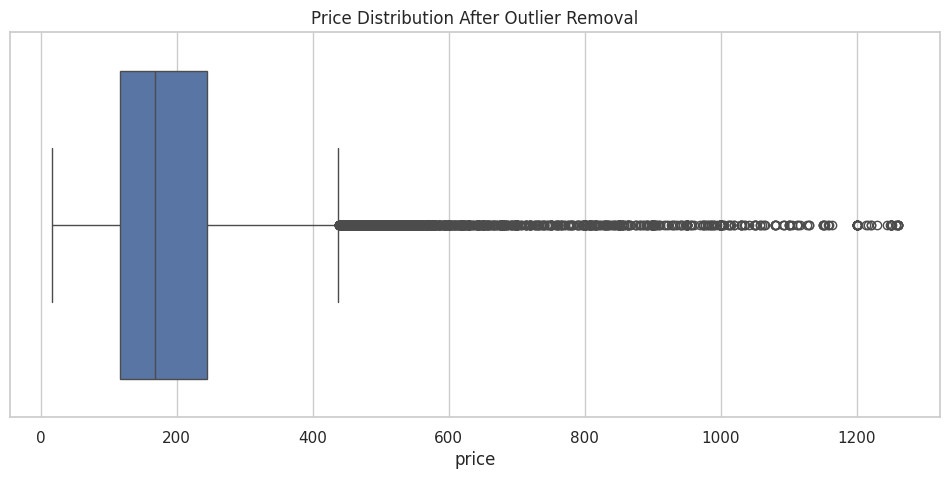


Price Statistics After Cleaning:
count    18434.000000
mean       208.918303
std        157.782330
min         17.000000
25%        117.000000
50%        168.000000
75%        245.000000
90%        377.000000
95%        500.000000
99%        900.000000
max       1260.000000
Name: price, dtype: float64

=== AMENITIES PROCESSING ===


/tmp/ipython-input-11-3224674116.py:49: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




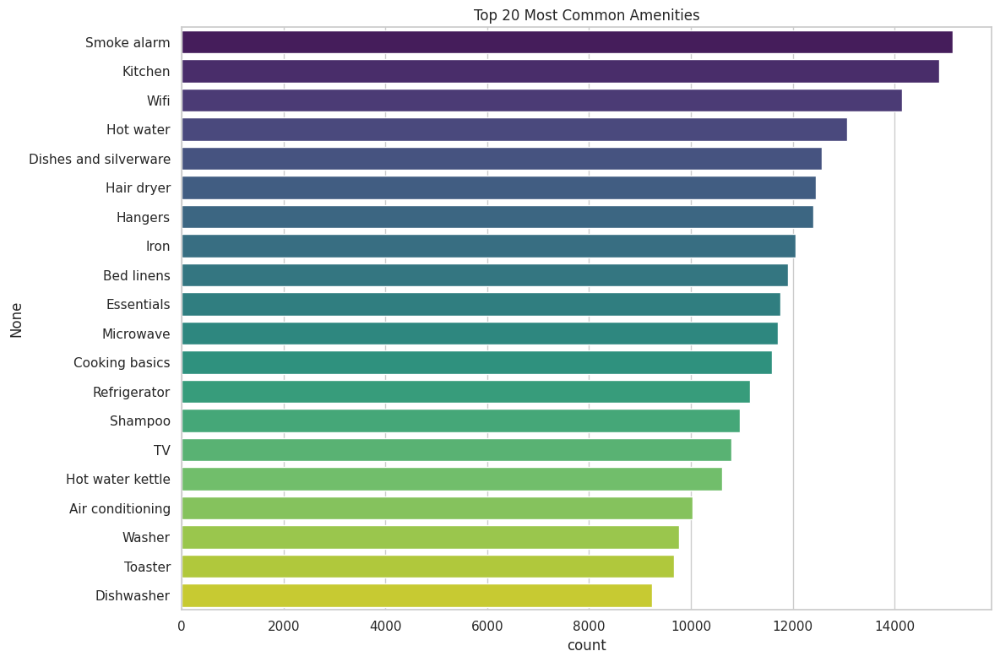


=== MISSING VALUE IMPUTATION ===

=== FINAL DATA VALIDATION ===

Remaining Missing Values:
id                                0
name                              0
host_id                           0
host_name                         0
host_since                        0
host_is_superhost                 0
neighbourhood                     0
host_neighbourhood                0
host_total_listings_count         0
latitude                          0
longitude                         0
property_type                     0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
amenities                         0
price                             0
minimum_nights                    0
maximum_nights                    0
availability_365                  0
number_of_reviews                 0
number_of_reviews_ltm             0
last_review                       0
host_res

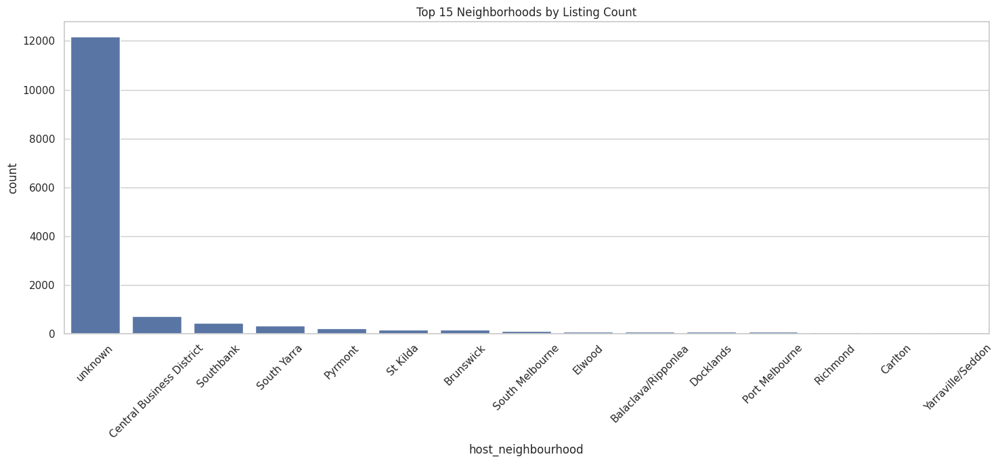


=== CLEANING PROCESS COMPLETE ===
Final Dataset Shape: (15973, 38)

--- Final Descriptive Statistics ---
                 id       host_id                     host_since  \
count  1.597300e+04  1.597300e+04                          15973   
mean   7.408602e+17  2.261752e+08  2018-05-25 17:10:47.968446720   
min    1.080300e+04  1.878500e+04            2009-05-25 00:00:00   
25%    4.890699e+07  4.195689e+07            2015-08-24 00:00:00   
50%    9.141478e+17  1.565964e+08            2017-10-30 00:00:00   
75%    1.181034e+18  4.128033e+08            2021-07-13 00:00:00   
max    1.367822e+18  6.818218e+08            2025-03-01 00:00:00   
std    5.125273e+17  2.017449e+08                            NaN   

       host_is_superhost  host_total_listings_count      latitude  \
count       15973.000000               15973.000000  15973.000000   
mean            0.362800                  50.274526    -37.826372   
min             0.000000                   1.000000    -38.270621   
25%  

In [11]:
# ======================
# DATA CLEANING PIPELINE
# ======================

# 1. Initial Setup
print("\n--- Initial Data Overview ---")
print(Melbourne1.info())
print("\n--- Descriptive Statistics ---")
print(Melbourne1.describe())

# 2. Outlier Treatment
print("\n=== OUTLIER HANDLING ===")

# Price Outliers
price_upper_limit = Melbourne1['price'].quantile(0.99)
Melbourne1 = Melbourne1[Melbourne1['price'] <= price_upper_limit].copy()

# Visual Validation
plt.figure(figsize=(12, 5))
sns.boxplot(x=Melbourne1['price'])
plt.title('Price Distribution After Outlier Removal')
plt.show()

print("\nPrice Statistics After Cleaning:")
print(Melbourne1['price'].describe(percentiles=[.25, .5, .75, .9, .95, .99]))

# Other Numeric Features
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

for col in ['beds', 'bedrooms', 'bathrooms']:
    Melbourne1 = remove_outliers(Melbourne1, col)

# 3. Amenities Processing
print("\n=== AMENITIES PROCESSING ===")
Melbourne1['amenities'] = Melbourne1['amenities'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])

# Top Amenities Visualization
all_amenities = [amenity for sublist in Melbourne1['amenities'] for amenity in sublist]
amenity_counts = Counter(all_amenities)
amenity_df = pd.DataFrame.from_dict(amenity_counts, orient='index', columns=['count']).sort_values('count', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='count', y=amenity_df.index[:20], data=amenity_df[:20], palette='viridis')
plt.title('Top 20 Most Common Amenities')
plt.tight_layout()
plt.show()

# 4. Missing Value Imputation
print("\n=== MISSING VALUE IMPUTATION ===")

# Categorical Columns
for col in ['host_neighbourhood', 'neighbourhood', 'host_name']:
    Melbourne1[col] = Melbourne1[col].fillna('unknown')

# Boolean Columns
Melbourne1['host_is_superhost'] = Melbourne1['host_is_superhost'].fillna(
    Melbourne1['host_is_superhost'].mode()[0]
)

# Numeric Columns
for col in ['bathrooms', 'bedrooms', 'beds']:
    Melbourne1[col] = Melbourne1[col].fillna(Melbourne1[col].mode()[0])

# Review Scores
review_columns = ['review_scores_rating', 'review_scores_accuracy',
                 'review_scores_cleanliness', 'review_scores_checkin',
                 'review_scores_communication', 'review_scores_location',
                 'review_scores_value']

for col in review_columns:
    Melbourne1[col] = Melbourne1[col].fillna(Melbourne1[col].median())

# Date Columns
for col in ['host_since', 'last_review']:
    Melbourne1[col] = Melbourne1[col].fillna(Melbourne1[col].median())

# Other Numeric Columns
for col in ['host_total_listings_count', 'reviews_per_month',
           'host_response_rate', 'host_acceptance_rate']:
    if Melbourne1[col].dtype == 'object':
        Melbourne1[col] = Melbourne1[col].astype(str).str.replace('%', '').astype(float) / 100
    Melbourne1[col] = Melbourne1[col].fillna(Melbourne1[col].mode()[0])

# 5. Final Data Validation
print("\n=== FINAL DATA VALIDATION ===")

# Missing Values Check
print("\nRemaining Missing Values:")
print(Melbourne1.isnull().sum().sort_values(ascending=False))

# Host Analysis
print("\n--- Host Information ---")
print(f"Date Range: {Melbourne1['host_since'].min()} to {Melbourne1['host_since'].max()}")
print(f"Superhost Distribution:\n{Melbourne1['host_is_superhost'].value_counts()}")

# Neighborhood Analysis
plt.figure(figsize=(15, 7))
top_neighborhoods = Melbourne1['host_neighbourhood'].value_counts().index[:15]
sns.countplot(x="host_neighbourhood", data=Melbourne1, order=top_neighborhoods)
plt.title('Top 15 Neighborhoods by Listing Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\n=== CLEANING PROCESS COMPLETE ===")
print(f"Final Dataset Shape: {Melbourne1.shape}")
print("\n--- Final Descriptive Statistics ---")
print(Melbourne1.describe())

##Geographic and Relationship Visualizations##

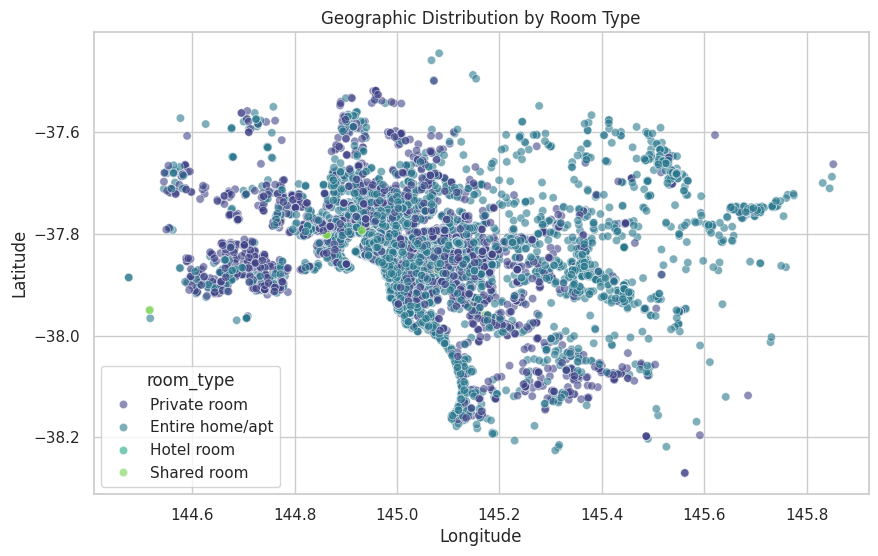

<Figure size 1000x600 with 0 Axes>

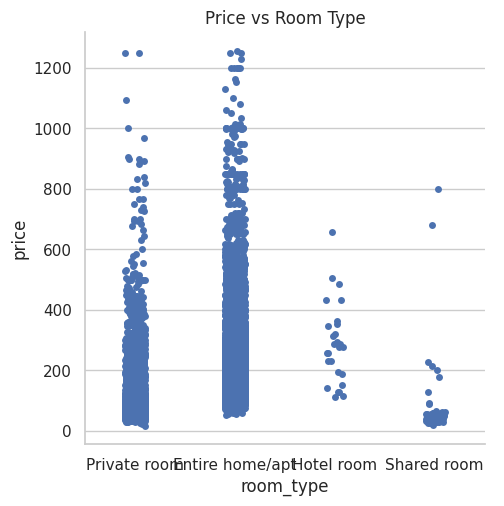

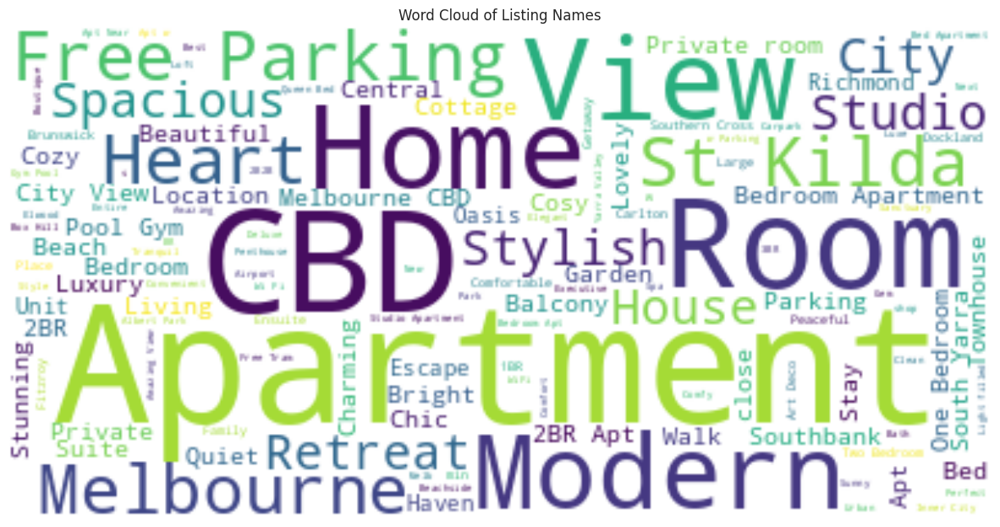


--- Property Type Distribution ---
property_type
Entire rental unit             8195
Private room in home           2059
Entire home                    1751
Private room in rental unit     793
Entire condo                    552
                               ... 
Train                             1
Shared room in guesthouse         1
Shared room in townhouse          1
Bus                               1
Ranch                             1
Name: count, Length: 66, dtype: int64


/tmp/ipython-input-12-430007931.py:50: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




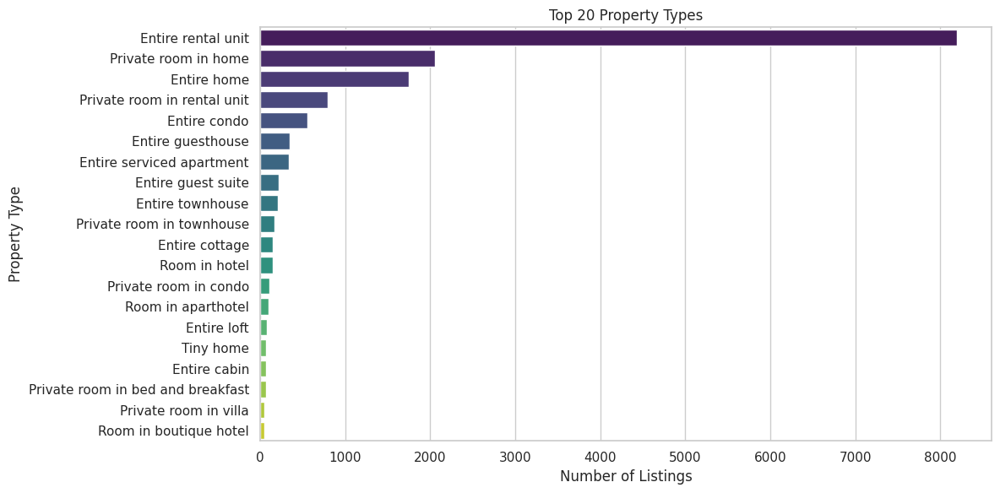

/tmp/ipython-input-12-430007931.py:73: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




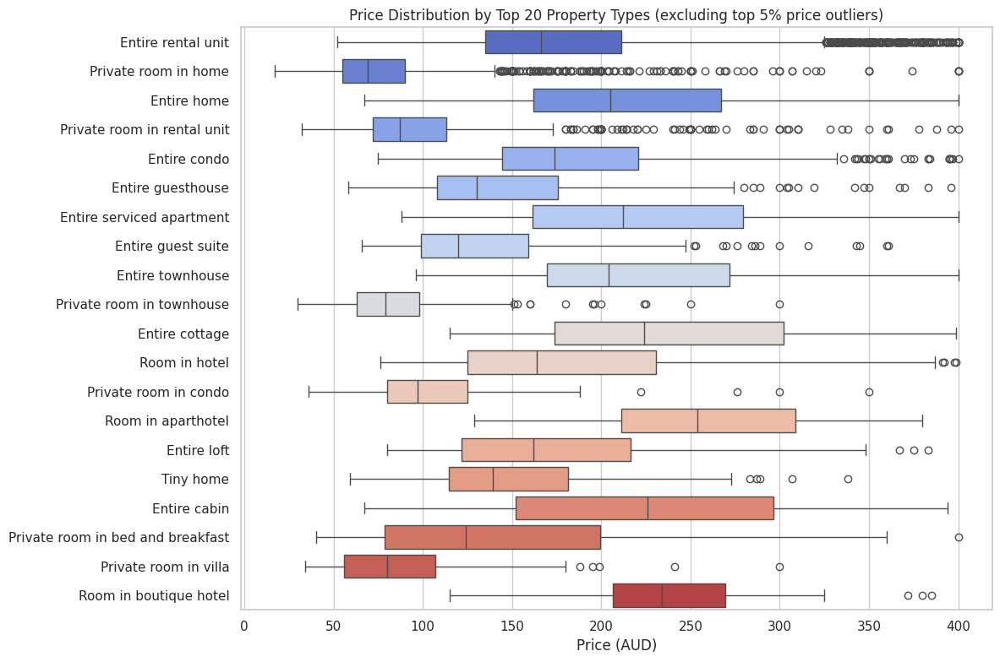


--- Room Type Breakdown by Property Type ---


room_type,Entire home/apt,Hotel room,Private room,Shared room,All
property_type,,,,,
All,12192,27,3700,54,15973
Entire rental unit,8195,0,0,0,8195
Private room in home,0,0,2059,0,2059
Entire home,1751,0,0,0,1751
Private room in rental unit,0,0,793,0,793
...,...,...,...,...,...
Ranch,1,0,0,0,1
Shared room in guesthouse,0,0,0,1,1
Shared room in resort,0,0,0,1,1


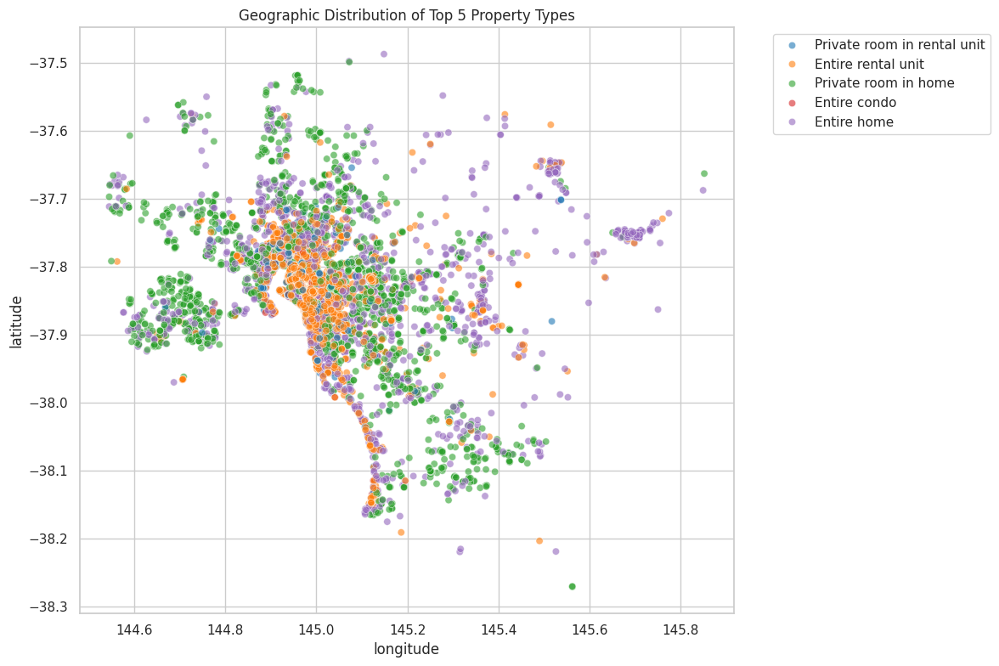


--- Price Statistics by Property Type ---
                              count        mean         std    min    25%  \
property_type                                                               
Entire rental unit           8195.0  197.207566  109.282530   52.0  136.0   
Private room in home         2059.0   87.449247   78.653894   17.0   55.0   
Entire home                  1751.0  255.861793  140.454520   67.0  167.0   
Private room in rental unit   793.0  111.982346   88.901331   32.0   72.0   
Entire condo                  552.0  217.081522  138.190584   75.0  147.0   
...                             ...         ...         ...    ...    ...   
Ranch                           1.0  120.000000         NaN  120.0  120.0   
Shared room in guesthouse       1.0   25.000000         NaN   25.0   25.0   
Shared room in resort           1.0  128.000000         NaN  128.0  128.0   
Shared room in townhouse        1.0   48.000000         NaN   48.0   48.0   
Train                           1

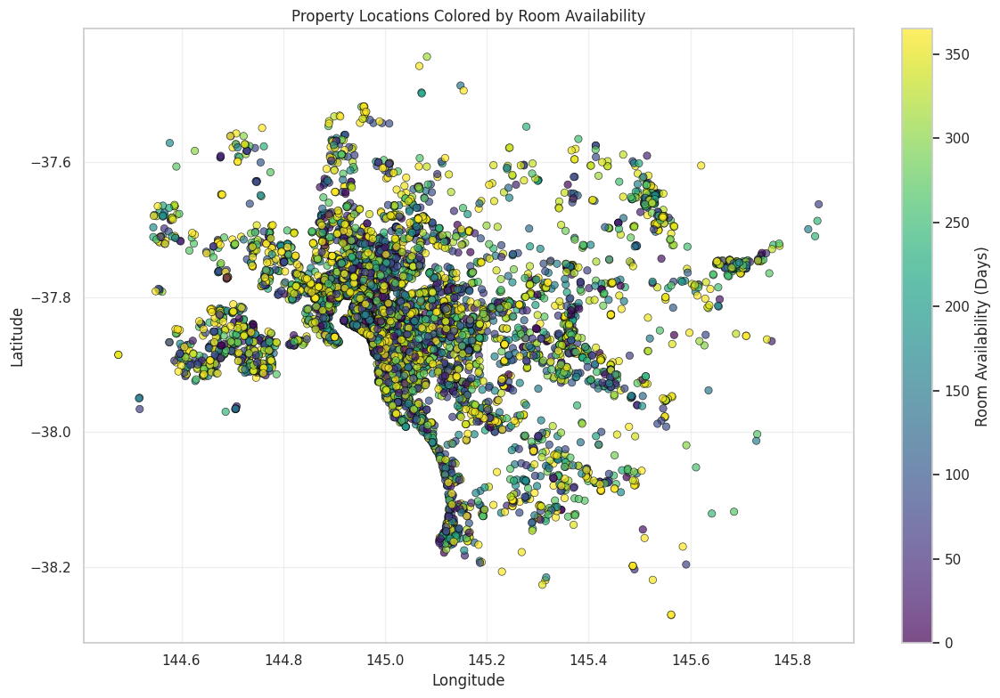

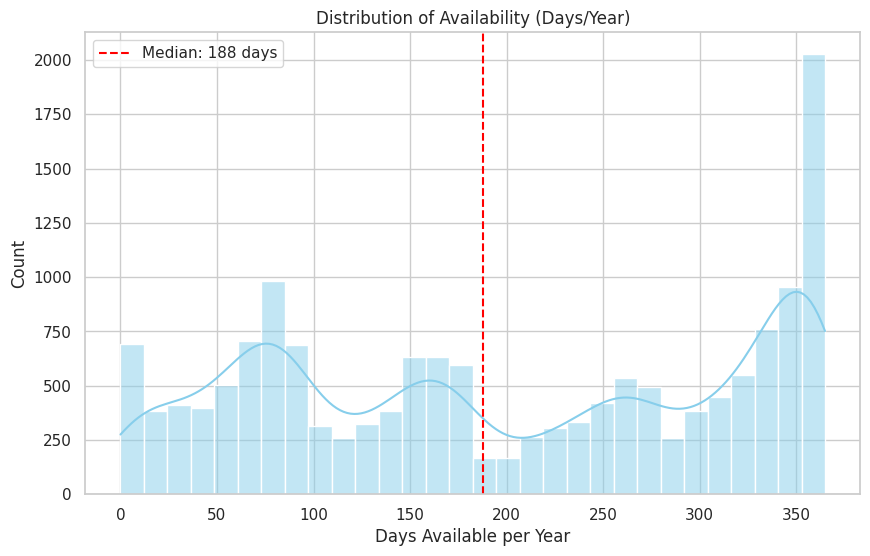

In [12]:
# Geographic distribution by room type
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='longitude',
    y='latitude',
    hue='room_type',
    data=Melbourne1,
    palette='viridis',
    alpha=0.6
)
plt.title('Geographic Distribution by Room Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Getting the room details (Donut Chart)
roomdf = Melbourne1.groupby('room_type').size()/Melbourne1['room_type'].count()*100
labels = roomdf.index
values = roomdf.values

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.6)])
fig.update_layout(title_text='Distribution of Room Types')
fig.show()

# Catplot room type and price
plt.figure(figsize=(10,6))
sns.catplot(x="room_type", y="price", data=Melbourne1);
plt.title('Price vs Room Type') # Add title to catplot
plt.ioff() # Turn off interactive mode, so plot doesn't show immediately if using it
plt.show() # Explicitly show the plot

# Word Cloud of Listing Names
text = " ".join(str(each) for each in Melbourne1.name.dropna()) # Ensure no NaNs are passed
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=200, background_color="white").generate(text)
plt.figure(figsize=(15,10)) # Adjust figure size for better display
# Display the generated image:
plt.imshow(wordcloud, interpolation='Bilinear')
plt.axis("off")
plt.title('Word Cloud of Listing Names') # Add title
plt.show()

# Property Type Distribution
prop_type_counts = Melbourne1['property_type'].value_counts(dropna=False)
print("\n--- Property Type Distribution ---")
print(prop_type_counts)

plt.figure(figsize=(12, 6))
sns.barplot(
    x=prop_type_counts.head(20).values,
    y=prop_type_counts.head(20).index,
    palette='viridis'
)
plt.title('Top 20 Property Types')
plt.xlabel('Number of Listings')
plt.ylabel('Property Type')
plt.tight_layout()
plt.show()

# Price Distribution by Top 20 Property Types (with outlier removal for visualization)
# Get top 20 property types by frequency
top_20_properties = Melbourne1['property_type'].value_counts().nlargest(20).index

# Filter the data to include only top 20 property types and remove top 5% price outliers
filtered_data = Melbourne1[
    (Melbourne1['property_type'].isin(top_20_properties)) &
    (Melbourne1['price'] <= Melbourne1['price'].quantile(0.95))
]

# Create the plot
plt.figure(figsize=(12, 8))
sns.boxplot(
    y='property_type',
    x='price',
    data=filtered_data,
    palette='coolwarm',
    order=top_20_properties  # This ensures the property types are ordered by frequency
)
plt.title('Price Distribution by Top 20 Property Types (excluding top 5% price outliers)')
plt.ylabel('')
plt.xlabel('Price (AUD)')
plt.tight_layout()
plt.show()

# Room type breakdown by property type
print("\n--- Room Type Breakdown by Property Type ---")
display(pd.crosstab(
    Melbourne1['property_type'],
    Melbourne1['room_type'],
    margins=True
).sort_values('All', ascending=False))

# Geographic distribution by property type (Top 5)
if all(col in Melbourne1.columns for col in ['latitude', 'longitude']):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        x='longitude',
        y='latitude',
        hue='property_type',
        data=Melbourne1[Melbourne1['property_type'].isin(prop_type_counts.head(5).index)],
        palette='tab10',
        alpha=0.6
    )
    plt.title('Geographic Distribution of Top 5 Property Types')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Adjust legend position
    plt.tight_layout()
    plt.show()

# Statistical summary by property type
print("\n--- Price Statistics by Property Type ---")
print(
    Melbourne1.groupby('property_type')['price']
    .describe(percentiles=[.25, .5, .75, .9])
    .sort_values('count', ascending=False)
)

# Room availability heatmap
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    x=Melbourne1['longitude'],
    y=Melbourne1['latitude'],
    c=Melbourne1['availability_365'],  # Color by room_availability
    cmap='viridis',
    edgecolor='black',
    linewidth=0.5,
    alpha=0.7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Room Availability (Days)')

# Add titles and labels
plt.title('Property Locations Colored by Room Availability')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of Availability
plt.figure(figsize=(10, 6))
sns.histplot(
    Melbourne1['availability_365'],
    bins=30,
    kde=True,
    color='skyblue'
)
plt.title('Distribution of Availability (Days/Year)')
plt.xlabel('Days Available per Year')
plt.ylabel('Count')
plt.axvline(
    Melbourne1['availability_365'].median(),
    color='red',
    linestyle='--',
    label=f'Median: {Melbourne1["availability_365"].median():.0f} days'
)
plt.legend()
plt.show()

##Data Quality Checks and Further Refinements ##


--- Melbourne1 DataFrame Information after cleaning and imputation ---
<class 'pandas.core.frame.DataFrame'>
Index: 15973 entries, 0 to 25945
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15973 non-null  int64         
 1   name                            15973 non-null  object        
 2   host_id                         15973 non-null  int64         
 3   host_name                       15973 non-null  object        
 4   host_since                      15973 non-null  datetime64[ns]
 5   host_is_superhost               15973 non-null  float64       
 6   neighbourhood                   15973 non-null  object        
 7   host_neighbourhood              15973 non-null  object        
 8   host_total_listings_count       15973 non-null  float64       
 9   latitude                        15973 non-null  float64       
 10  lon

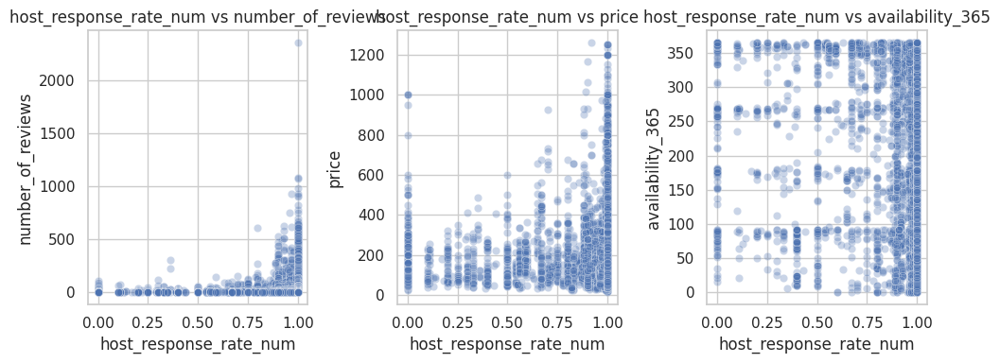

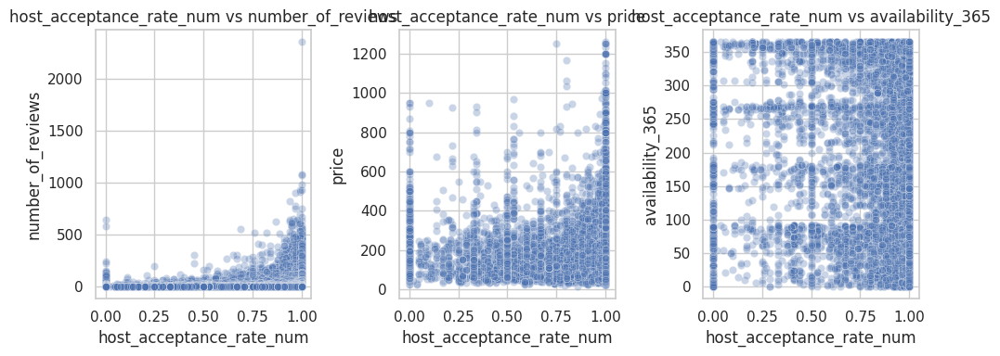


--- Data Quality Issues (Value Ranges) ---
Negative Prices: 0
Zero Accommodates: 0
Availability >365: 0
Bedrooms >20: 0
Bathrooms >10: 0

--- Listings with more than 10 bathrooms ---


,id,name,host_name,property_type,bathrooms,bedrooms,accommodates,price,latitude,longitude



--- Entries with invalid review scores (outside 1-10 range) ---
Number of listings with invalid review scores: 0

Review Score Columns Checked: ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

--- Properties with initial capacity inconsistencies ---
Total properties with capacity inconsistencies: 384
Beds > Accommodates: 169
Bedrooms > Accommodates: 75
Bathrooms > Accommodates: 198

--- Capacity Correction Report ---
Corrected 169 beds values.
Corrected 75 bedrooms values.
Corrected 198 bathrooms values.

--- All capacity constraints validated successfully! ---


In [13]:
print("\n--- Melbourne1 DataFrame Information after cleaning and imputation ---")
print(Melbourne1.info())

# Host Since Analysis
print("\n=== Host Since ===")
print("Date Range:",
      Melbourne1['host_since'].min().strftime('%Y-%m-%d'), "to",
      Melbourne1['host_since'].max().strftime('%Y-%m-%d'))
print("Median Host Tenure:",
      (datetime.now() - Melbourne1['host_since'].median()).days, "days")

# Last Review Analysis (with missing value handling)
print("\n=== Last Review ===")
if Melbourne1['last_review'].notna().any():
    print("Date Range (non-null):",
          Melbourne1['last_review'].min().strftime('%Y-%m-%d'), "to",
          Melbourne1['last_review'].max().strftime('%Y-%m-%d'))
else:
    print("No valid review dates found")

print("Null Values:", Melbourne1['last_review'].isna().sum())

# Review Date Consistency Check
active_without_reviews = Melbourne1[
    (Melbourne1['number_of_reviews'] > 0) &
    (Melbourne1['last_review'].isna())
]

print("\n=== Data Quality Issues (Date) ===")
print(f"Listings with reviews but missing 'last_review' dates: {len(active_without_reviews)}")
print(f"Listings with future 'last_review' dates: {len(Melbourne1[Melbourne1['last_review'] > datetime.now()])}")

# Host Response Rate and Acceptance Rate Analysis
print("\n--- Host Response Rate Info ---")
print(Melbourne1['host_response_rate'].info())
print("\n--- Host Response Rate Head ---")
print(Melbourne1['host_response_rate'].head())
print("\n--- Host Response Rate Description ---")
print(Melbourne1['host_response_rate'].describe())

print("\n--- Host Acceptance Rate Info ---")
print(Melbourne1['host_acceptance_rate'].info())
print("\n--- Host Acceptance Rate Head ---")
print(Melbourne1['host_acceptance_rate'].head())
print("\n--- Host Acceptance Rate Info (re-check) ---")
print(Melbourne1['host_acceptance_rate'].info())

# Convert percentage strings to numeric (re-run in case previous imputation didn't handle it fully)
def convert_percentage(rate):
    if pd.isna(rate):
        return np.nan
    # Check if it's already a float (from previous imputation)
    if isinstance(rate, (float, int)):
        return float(rate)
    return float(str(rate).strip('%'))/100

Melbourne1['host_response_rate_num'] = Melbourne1['host_response_rate'].apply(convert_percentage)
Melbourne1['host_acceptance_rate_num'] = Melbourne1['host_acceptance_rate'].apply(convert_percentage)

# Check missingness correlation
missing_data_rates = Melbourne1[['host_response_rate_num', 'host_acceptance_rate_num']].isnull()
print("\n--- Missing Value Correlation (Response/Acceptance Rates) ---")
print(missing_data_rates.corr())

# Compare superhost vs non-superhost
print("\n--- Missing rates by superhost status ---")
print(missing_data_rates.groupby(Melbourne1['host_is_superhost']).mean())

# Comparative analysis with review scores
review_cols = ['review_scores_rating', 'review_scores_communication']
for rate in ['host_response_rate_num', 'host_acceptance_rate_num']:
    print(f"\n--- Correlation between {rate} and review scores ---")
    print(Melbourne1[[rate] + review_cols].corr())

performance_metrics = ['number_of_reviews', 'price', 'availability_365']
for rate in ['host_response_rate_num', 'host_acceptance_rate_num']:
    plt.figure(figsize=(10,4))
    for i, metric in enumerate(performance_metrics):
        plt.subplot(1,3,i+1)
        sns.scatterplot(x=rate, y=metric, data=Melbourne1, alpha=0.3)
        plt.title(f'{rate} vs {metric}')
    plt.tight_layout()
    plt.show()

# Value range validation
# Check for impossible values
issues = {
    'Negative Prices': len(Melbourne1[Melbourne1['price'] <= 0]),
    'Zero Accommodates': len(Melbourne1[Melbourne1['accommodates'] == 0]),
    'Availability >365': len(Melbourne1[Melbourne1['availability_365'] > 365]),
    'Bedrooms >20': len(Melbourne1[Melbourne1['bedrooms'] > 20]),
    'Bathrooms >10': len(Melbourne1[Melbourne1['bathrooms'] > 10])
}
print("\n--- Data Quality Issues (Value Ranges) ---")
for issue, count in issues.items():
    print(f"{issue}: {count}")

# Get listings with more than 10 bathrooms
luxury_bathrooms = Melbourne1[Melbourne1['bathrooms'] > 10]
print("\n--- Listings with more than 10 bathrooms ---")
display(luxury_bathrooms[[
    'id', 'name', 'host_name', 'property_type',
    'bathrooms', 'bedrooms', 'accommodates', 'price',
    'latitude', 'longitude'
]].sort_values('bathrooms', ascending=False))

# Review score validation
# All review scores should be between 1-10
review_cols_num = [c for c in Melbourne1.columns if c.startswith('review_scores_') and c != 'reviews_per_month'] # Exclude reviews_per_month
invalid_reviews = Melbourne1[(Melbourne1[review_cols_num] < 1).any(axis=1) |
                             (Melbourne1[review_cols_num] > 10).any(axis=1)]
print("\n--- Entries with invalid review scores (outside 1-10 range) ---")
print(f"Number of listings with invalid review scores: {len(invalid_reviews)}")

print("\nReview Score Columns Checked:", review_cols_num)

# Logical relationship (Capacity Consistency)
capacity_issues_df = Melbourne1[
    (Melbourne1['beds'] > Melbourne1['accommodates']) |
    (Melbourne1['bedrooms'] > Melbourne1['accommodates']) |
    (Melbourne1['bathrooms'] > Melbourne1['accommodates'])
]
print("\n--- Properties with initial capacity inconsistencies ---")
print(f"Total properties with capacity inconsistencies: {len(capacity_issues_df)}")

# Breakdown of inconsistency types
print(f"Beds > Accommodates: {len(capacity_issues_df[capacity_issues_df['beds'] > capacity_issues_df['accommodates']])}")
print(f"Bedrooms > Accommodates: {len(capacity_issues_df[capacity_issues_df['bedrooms'] > capacity_issues_df['accommodates']])}")
print(f"Bathrooms > Accommodates: {len(capacity_issues_df[capacity_issues_df['bathrooms'] > capacity_issues_df['accommodates']])}")

def correct_capacity(df):
    """Corrects capacity inconsistencies where beds/bedrooms/bathrooms exceed accommodates."""
    original = df.copy()

    # Apply corrections for each column
    for col in ['beds', 'bedrooms', 'bathrooms']:
        # Only correct if the value is greater than accommodates
        mask = (df[col].notna()) & (df['accommodates'].notna()) & (df[col] > df['accommodates'])
        df.loc[mask, col] = df.loc[mask, 'accommodates']

    # Report changes
    print("\n--- Capacity Correction Report ---")
    for col in ['beds', 'bedrooms', 'bathrooms']:
        changed = (original[col] != df[col]).sum()
        print(f"Corrected {changed} {col} values.")

    return df

Melbourne1 = correct_capacity(Melbourne1)

def validate_capacity(df):
    """Validates if capacity issues remain after correction."""
    issues = {
        'beds': len(df[df['beds'] > df['accommodates']]),
        'bedrooms': len(df[df['bedrooms'] > df['accommodates']]),
        'bathrooms': len(df[df['bathrooms'] > df['accommodates']])
    }
    if any(issues.values()):
        print("\n--- Remaining issues after correction ---")
        for k, v in issues.items():
            print(f"{k}: {v}")
    else:
        print("\n--- All capacity constraints validated successfully! ---")

validate_capacity(Melbourne1)

##Geographic Feature Engineering ##

In [14]:
# Create base map centered on Melbourne
# Corrected Melbourne CBD coordinates
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=11)

# Create heatmap layer
# Ensure 'latitude' and 'longitude' are not NaN for heatmap
heat_data = Melbourne1[['latitude', 'longitude']].dropna().values.tolist()

HeatMap(
    heat_data,
    radius=8,
    blur=10,
    gradient={0.2: 'blue', 0.4: 'purple', 0.6: 'orange', 1.0: 'red'}
).add_to(m)

print("\n--- Interactive Heatmap of Listing Density in Melbourne ---")
# Display the map. In a script, you might save it: m.save('heatmap.html')
display(m)

# Distance to Melbourne CBD
# Melbourne CBD coordinates (Flinders Street Station)
CBD_COORD = (-37.8183, 144.9671)

def calculate_distance(lat, lon, ref_point=CBD_COORD):
    """Calculate distance in kilometers from reference point."""
    if pd.isna(lat) or pd.isna(lon):
        return np.nan # Return NaN if coordinates are missing
    return geodesic((lat, lon), ref_point).km

# Add distance to CBD column
Melbourne1['distance_to_cbd'] = Melbourne1.apply(
    lambda x: calculate_distance(x['latitude'], x['longitude']), axis=1
)
print("\n--- Distance to CBD Head ---")
print(Melbourne1['distance_to_cbd'].head())

# Distance to major landmarks
# Define major POIs in Melbourne
LANDMARKS = {
    'melbourne_airport': (-37.6733, 144.8433),
    'southern_cross_station': (-37.8184, 144.9524),
    'university_of_melbourne': (-37.7963, 144.9614),
    'federation_square': (-37.8180, 144.9691),
    'st_kilda_beach': (-37.8676, 144.9809)
}

# Calculate distances to each landmark
for name, coords in LANDMARKS.items():
    Melbourne1[f'distance_to_{name}'] = Melbourne1.apply(
        lambda x: calculate_distance(x['latitude'], x['longitude'], coords), axis=1
    )
print("\n--- Distance to Landmarks Head (e.g., Melbourne Airport) ---")
print(Melbourne1['distance_to_melbourne_airport'].head())

# Listing density features
# Convert coordinates to radians for BallTree (dropna to avoid errors)
coords_for_tree = Melbourne1[['latitude', 'longitude']].dropna()
if not coords_for_tree.empty:
    coords_rad = np.deg2rad(coords_for_tree)
    tree = BallTree(coords_rad, metric='haversine')

    # Calculate listings within 1km radius
    distances_rad = 1 / 6371  # 1km in radians (Earth's radius in km)
    # Create a Series with NaNs for original index, then fill valid results
    listings_1km = pd.Series(np.nan, index=Melbourne1.index)
    listings_1km.loc[coords_for_tree.index] = tree.query_radius(
        coords_rad, r=distances_rad, count_only=True
    )
    Melbourne1['listings_within_1km'] = listings_1km
    print("\n--- Listings Within 1km Head ---")
    print(Melbourne1['listings_within_1km'].head())

    # Optional: Add features for different radii
    for radius in [0.5, 2, 5]:  # in km
        rad_val = radius / 6371
        listings_rad = pd.Series(np.nan, index=Melbourne1.index)
        listings_rad.loc[coords_for_tree.index] = tree.query_radius(
            coords_rad, r=rad_val, count_only=True
        )
        Melbourne1[f'listings_within_{radius}km'] = listings_rad
        print(f"Listings Within {radius}km added.")
else:
    print("Skipping density feature engineering: No valid coordinates found.")

print("\n--- Final DataFrame Information after Geographic Features ---")
print(Melbourne1.info())


--- Interactive Heatmap of Listing Density in Melbourne ---



--- Distance to CBD Head ---
0     5.900382
3    15.909154
4    39.713608
6     0.716989
8     6.272037
Name: distance_to_cbd, dtype: float64

--- Distance to Landmarks Head (e.g., Melbourne Airport) ---
0    15.818201
3    34.760636
4    58.906496
6    18.729646
8    22.287395
Name: distance_to_melbourne_airport, dtype: float64

--- Listings Within 1km Head ---
0      74.0
3      12.0
4      17.0
6    3132.0
8      34.0
Name: listings_within_1km, dtype: float64
Listings Within 0.5km added.
Listings Within 2km added.
Listings Within 5km added.

--- Final DataFrame Information after Geographic Features ---
<class 'pandas.core.frame.DataFrame'>
Index: 15973 entries, 0 to 25945
Data columns (total 50 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   id                                   15973 non-null  int64         
 1   name                                 15973 non-null  objec

##Import##

In [15]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=de283f300a0a41f5616b5b357c4d83397a70d67ea210a5487b185bfd2bbf9e51
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [16]:
import folium
from folium.plugins import HeatMap
import geopandas as gpd
from shapely.geometry import Point
from libpysal.weights import DistanceBand
from scipy.stats import ttest_ind, f_oneway
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
import shap
import lime
import lime.lime_tabular
from datetime import datetime

##Initial Data Exploration and Preprocessing##

--- Initial Data Info ---
<class 'pandas.core.frame.DataFrame'>
Index: 15973 entries, 0 to 25945
Data columns (total 50 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   id                                   15973 non-null  int64         
 1   name                                 15973 non-null  object        
 2   host_id                              15973 non-null  int64         
 3   host_name                            15973 non-null  object        
 4   host_since                           15973 non-null  datetime64[ns]
 5   host_is_superhost                    15973 non-null  float64       
 6   neighbourhood                        15973 non-null  object        
 7   host_neighbourhood                   15973 non-null  object        
 8   host_total_listings_count            15973 non-null  float64       
 9   latitude                             15973 non-null  float64  

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:202: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:207: RuntimeWarning:

All-NaN slice encountered



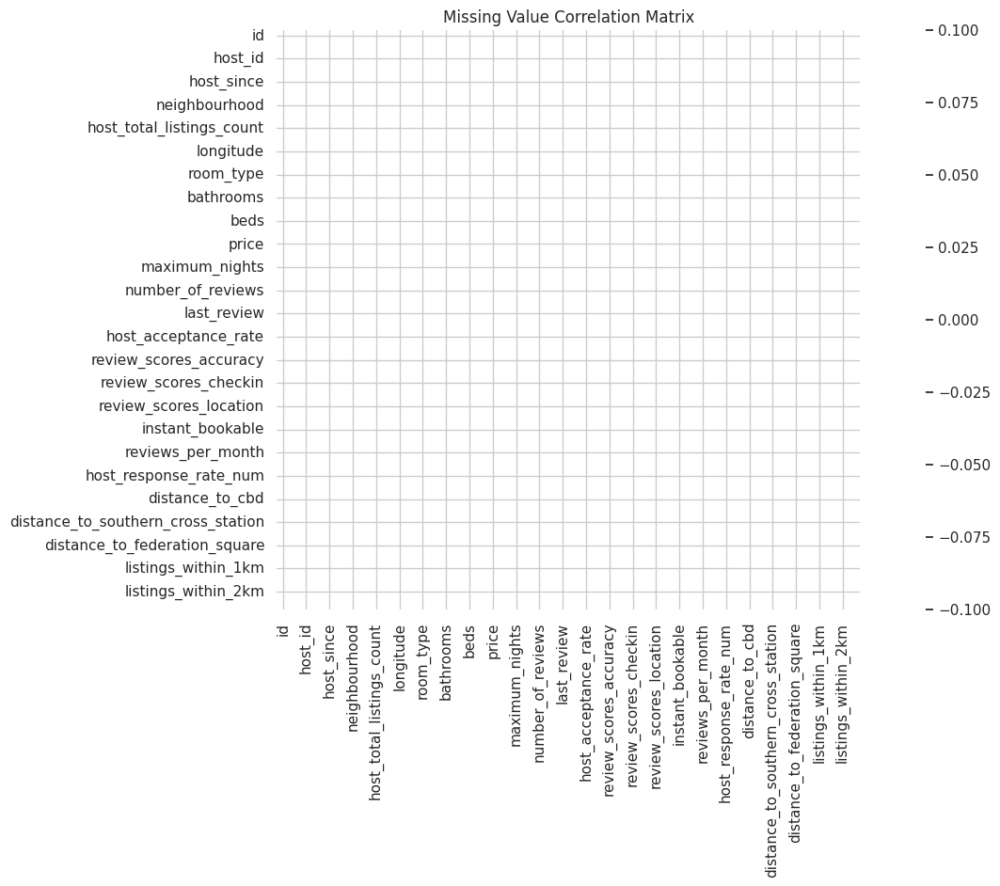


--- Host Superhost Status for Missing Host Neighbourhoods ---
Series([], Name: proportion, dtype: float64)

--- Host Neighbourhood Value Counts (after imputation) ---
host_neighbourhood
unknown                      12172
Central Business District      730
Southbank                      454
South Yarra                    351
Pyrmont                        220
                             ...  
IV Arrondissement                1
Rajagiriya                       1
G-11/3                           1
Khu đô thị VCN                   1
Grachtengordel                   1
Name: count, Length: 98, dtype: int64


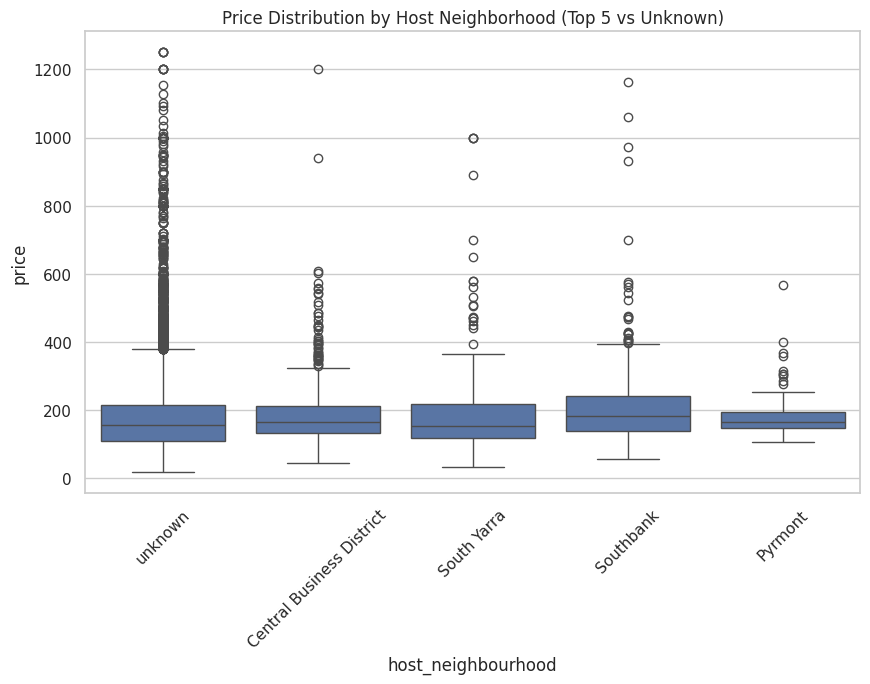


--- Superhost Rates by Host Neighbourhood ---
host_neighbourhood
Bali                    1.0
Annandale/Leichhardt    1.0
Bronte                  1.0
Centro                  1.0
Bondi                   1.0
Benito Juárez           1.0
Venice                  1.0
La Jolla                1.0
Malvern                 1.0
G-11/3                  1.0
Name: host_is_superhost, dtype: float64

--- T-test p-value for Price (Known vs Unknown Host Neighbourhood): nan ---

--- Cross-tab: Host Neighbourhood vs Property Type ---


/usr/local/lib/python3.11/dist-packages/scipy/_lib/deprecation.py:234: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.



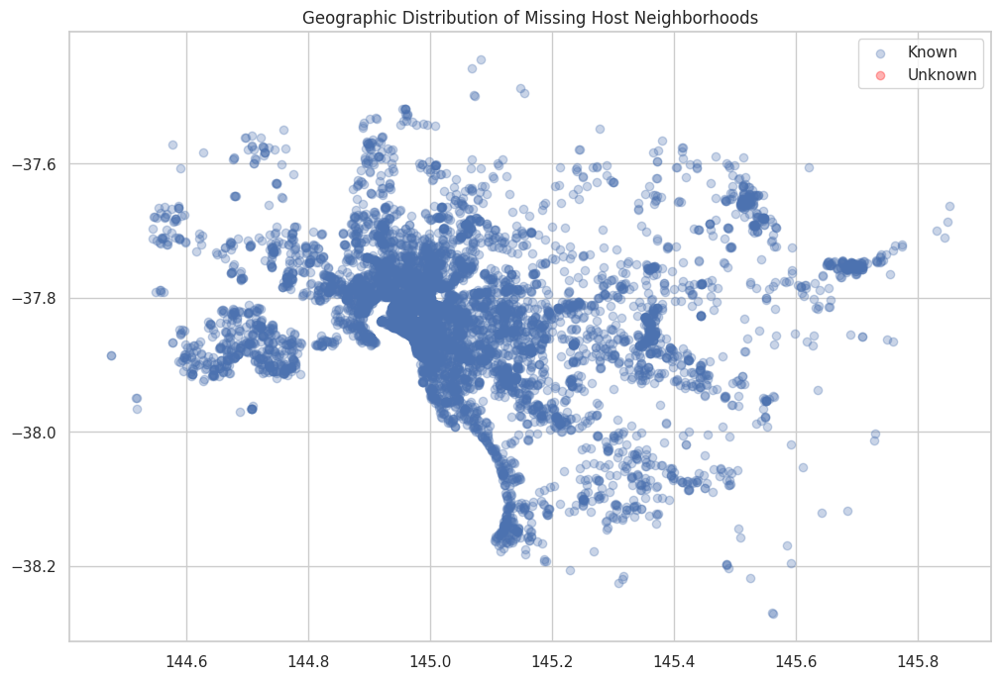

/tmp/ipython-input-17-571529536.py:72: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



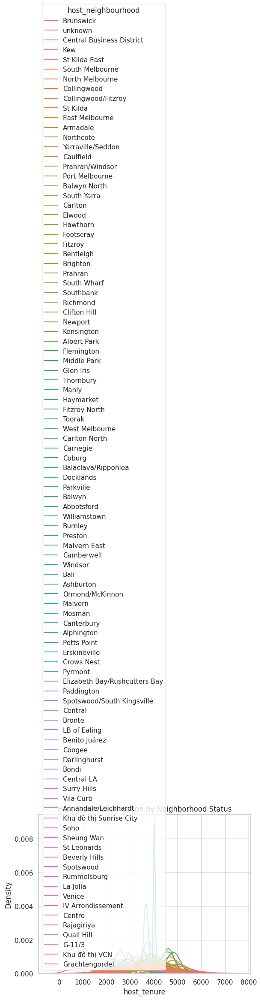

In [17]:
print("--- Initial Data Info ---")
print(Melbourne1.info())

print("\n--- Descriptive Statistics for Distance and Listings ---")
print(Melbourne1[['distance_to_cbd', 'listings_within_1km']].describe())

print("\n--- Host Neighbourhood Information ---")
print(Melbourne1['host_neighbourhood'].info())
print(Melbourne1['host_neighbourhood'].head())
print(Melbourne1['host_neighbourhood'].describe())

# Check missingness patterns
print("\n--- Missing Value Correlation Matrix ---")
missing_corr = Melbourne1.isnull().corr()
plt.figure(figsize=(10, 8))
sns.heatmap(missing_corr, cmap='coolwarm', center=0)
plt.title('Missing Value Correlation Matrix')
plt.show()

# Check if missingness is related to other variables
print("\n--- Host Superhost Status for Missing Host Neighbourhoods ---")
print(Melbourne1[Melbourne1['host_neighbourhood'].isnull()]['host_is_superhost'].value_counts(normalize=True))

# Create new column with missing indicator
Melbourne1['host_neighbourhood'] = Melbourne1['host_neighbourhood'].fillna('Unknown')

# Verify missing value imputation
print("\n--- Host Neighbourhood Value Counts (after imputation) ---")
print(Melbourne1['host_neighbourhood'].value_counts(dropna=False))

# Price comparison for top 5 neighborhoods vs Unknown
plt.figure(figsize=(10, 6))
sns.boxplot(x='host_neighbourhood', y='price',
            data=Melbourne1[Melbourne1['host_neighbourhood'].isin(
                ['Unknown'] + list(Melbourne1['host_neighbourhood'].value_counts().index[:5]))])
plt.xticks(rotation=45)
plt.title('Price Distribution by Host Neighborhood (Top 5 vs Unknown)')
plt.show()

# Superhost rate comparison
print("\n--- Superhost Rates by Host Neighbourhood ---")
superhost_rates = Melbourne1.groupby('host_neighbourhood')['host_is_superhost'].mean().sort_values(ascending=False)
print(superhost_rates.head(10))

# T-test for price differences between known and unknown host neighborhoods
known_price = Melbourne1[Melbourne1['host_neighbourhood'] != 'Unknown']['price']
unknown_price = Melbourne1[Melbourne1['host_neighbourhood'] == 'Unknown']['price']

t_stat, p_value = ttest_ind(known_price, unknown_price, equal_var=False)
print(f"\n--- T-test p-value for Price (Known vs Unknown Host Neighbourhood): {p_value:.4f} ---")

# Cross-tab with property type
print("\n--- Cross-tab: Host Neighbourhood vs Property Type ---")
print(pd.crosstab(Melbourne1['host_neighbourhood'],
                  Melbourne1['property_type'],
                  normalize='index').style.background_gradient(cmap='Blues'))

# Geographic plot of known vs unknown
known = Melbourne1[Melbourne1['host_neighbourhood'] != 'Unknown']
unknown = Melbourne1[Melbourne1['host_neighbourhood'] == 'Unknown']

plt.figure(figsize=(12, 8))
plt.scatter(known['longitude'], known['latitude'], alpha=0.3, label='Known')
plt.scatter(unknown['longitude'], unknown['latitude'], alpha=0.3, c='red', label='Unknown')
plt.legend()
plt.title('Geographic Distribution of Missing Host Neighborhoods')
plt.show()

# Temporal analysis (if host_since available)
Melbourne1['host_since'] = pd.to_datetime(Melbourne1['host_since'])
Melbourne1['host_tenure'] = (pd.to_datetime('today') - Melbourne1['host_since']).dt.days
sns.kdeplot(data=Melbourne1, x='host_tenure', hue='host_neighbourhood', common_norm=False)
plt.title('Host Tenure Distribution by Neighborhood Status')
plt.show()


##Neighbourhood analysis##

In [18]:
# Create working dataset with only known neighborhoods
known_neighborhoods = Melbourne1[Melbourne1['host_neighbourhood'] != 'Unknown'].copy()

# Top neighborhoods by listings count
print("\n--- Top 10 Neighborhoods by Listings Count ---")
top_neighborhoods = known_neighborhoods['host_neighbourhood'].value_counts().nlargest(10)
print(top_neighborhoods)

# Neighborhood performance metrics
print("\n--- Neighborhood Performance Metrics ---")
neighborhood_stats = known_neighborhoods.groupby('host_neighbourhood').agg({
    'price': ['median', 'count'],
    'review_scores_rating': 'median',
    'host_is_superhost': 'mean',
    'number_of_reviews': 'median'
}).sort_values(('price', 'median'), ascending=False)
print(neighborhood_stats.head(10).to_string())

# ANOVA test for price differences among top 5 neighborhoods
top_5_neigh = known_neighborhoods['host_neighbourhood'].value_counts().nlargest(5).index
groups_anova = [known_neighborhoods[known_neighborhoods['host_neighbourhood']==n]['price']
                for n in top_5_neigh]
f_stat_anova, p_value_anova = f_oneway(*groups_anova)
print(f"\n--- ANOVA p-value for price differences (Top 5 Neighborhoods): {p_value_anova:.4f} ---")


--- Top 10 Neighborhoods by Listings Count ---
host_neighbourhood
unknown                      12172
Central Business District      730
Southbank                      454
South Yarra                    351
Pyrmont                        220
St Kilda                       182
Brunswick                      172
South Melbourne                126
Elwood                         103
Balaclava/Ripponlea            100
Name: count, dtype: int64

--- Neighborhood Performance Metrics ---
                    price       review_scores_rating host_is_superhost number_of_reviews
                   median count               median              mean            median
host_neighbourhood                                                                      
Crows Nest          650.0     7                4.840          0.000000               0.0
Ormond/McKinnon     552.5     2                4.730          0.000000               7.5
Quail Hill          443.0    33                4.840          0.000000

##Price prediction and feature importance##

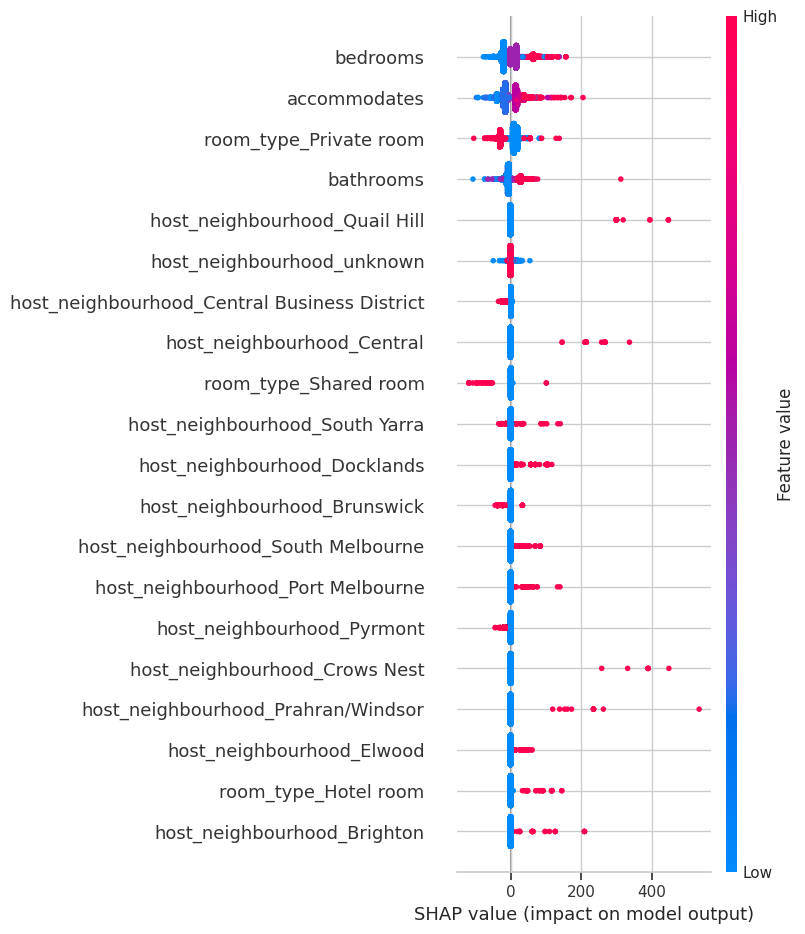

In [19]:
# Features for price prediction
features_price_pred = ['accommodates', 'bedrooms', 'bathrooms', 'host_neighbourhood', 'room_type']

# Ensure 'neighbourhood' is available in Melbourne1 and handle it appropriately (e.g., one-hot encode)
# For simplicity, if 'neighbourhood' is categorical, ensure it's handled for get_dummies
if 'host_neighbourhood' in Melbourne1.columns:
    X_price_pred = pd.get_dummies(Melbourne1[features_price_pred].dropna(), columns=['host_neighbourhood', 'room_type'], drop_first=True)
else: # If 'neighbourhood' column doesn't exist, simplify features
    features_price_pred = ['accommodates', 'bedrooms', 'bathrooms', 'room_type']
    X_price_pred = pd.get_dummies(Melbourne1[features_price_pred].dropna(), columns=['room_type'], drop_first=True)

y_price_pred = Melbourne1['price'].loc[X_price_pred.index] # Align target with features

# Train XGBoost model for SHAP analysis
xgb_model_shap = XGBRegressor(random_state=42)
xgb_model_shap.fit(X_price_pred, y_price_pred)

# SHAP analysis
explainer_shap = shap.TreeExplainer(xgb_model_shap)
shap_values = explainer_shap.shap_values(X_price_pred)
shap.summary_plot(shap_values, X_price_pred)


##Demand Forecasting##

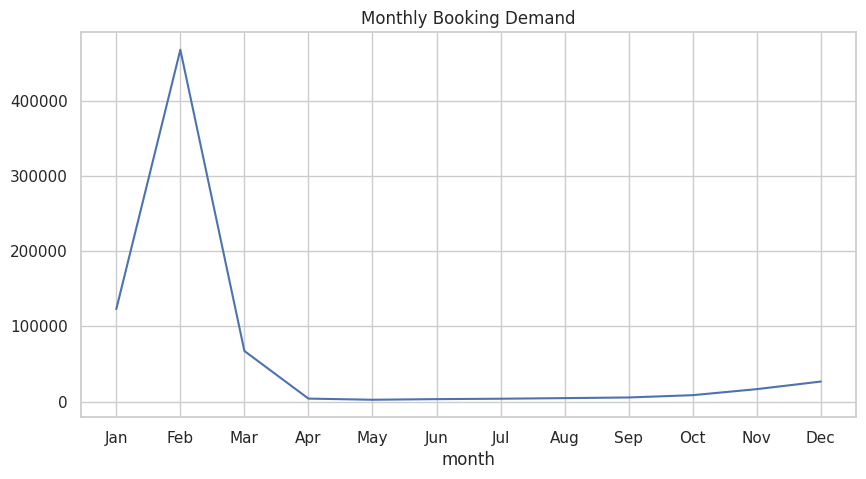

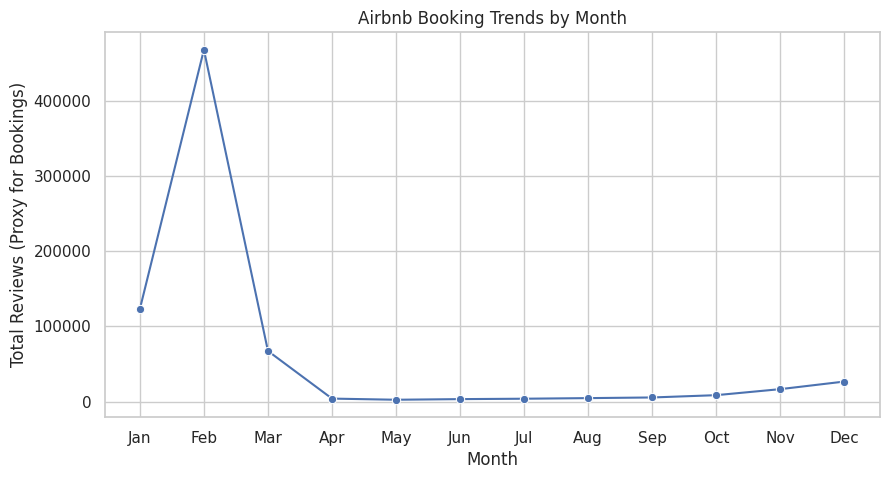


--- Seasonal Performance ---
   season  number_of_reviews
0  Autumn              73500
1  Spring              30304
2  Summer             618063
3  Winter              11408

--- Interactive Demand Map (displayed below) ---


In [20]:
# Seasonal demand visualization
Melbourne1['last_review'] = pd.to_datetime(Melbourne1['last_review'])
Melbourne1['month'] = Melbourne1['last_review'].dt.month
monthly_demand = Melbourne1.groupby('month')['number_of_reviews'].sum()

plt.figure(figsize=(10, 5))
sns.lineplot(x=monthly_demand.index, y=monthly_demand.values)
plt.xticks(range(1,13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.title('Monthly Booking Demand')
plt.show()

# Booking trends by month and season
Melbourne1['review_month'] = Melbourne1['last_review'].dt.month
Melbourne1['review_year'] = Melbourne1['last_review'].dt.year

seasonal_trends = Melbourne1.groupby('review_month')['number_of_reviews'].sum().reset_index()

season_map = {
    1: 'Summer', 2: 'Summer', 3: 'Autumn',
    4: 'Autumn', 5: 'Autumn', 6: 'Winter',
    7: 'Winter', 8: 'Winter', 9: 'Spring',
    10: 'Spring', 11: 'Spring', 12: 'Summer'
}
seasonal_trends['season'] = seasonal_trends['review_month'].map(season_map)

plt.figure(figsize=(10, 5))
sns.lineplot(x='review_month', y='number_of_reviews', data=seasonal_trends, marker='o')
plt.title("Airbnb Booking Trends by Month")
plt.xlabel("Month")
plt.ylabel("Total Reviews (Proxy for Bookings)")
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

print("\n--- Seasonal Performance ---")
seasonal_performance = seasonal_trends.groupby('season')['number_of_reviews'].sum().reset_index()
print(seasonal_performance)

# Top neighborhoods by demand (number of reviews) and heatmap
neighborhood_demand = Melbourne1.groupby('neighbourhood').agg({
    'number_of_reviews': 'sum',
    'latitude': 'mean',
    'longitude': 'mean'
}).reset_index()

top_neighborhoods_demand = neighborhood_demand.sort_values('number_of_reviews', ascending=False).head(20)

melbourne_map_demand = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

HeatMap(
    data=Melbourne1[['latitude', 'longitude']].values,
    radius=15,
    blur=10,
).add_to(melbourne_map_demand)

for idx, row in top_neighborhoods_demand.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['number_of_reviews'] / 500,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"{row['neighbourhood']} (Reviews: {row['number_of_reviews']})"
    ).add_to(melbourne_map_demand)

# melbourne_map_demand.save('airbnb_demand_map.html') # Uncomment to save
print("\n--- Interactive Demand Map (displayed below) ---")
display(melbourne_map_demand)



##Host Performance##

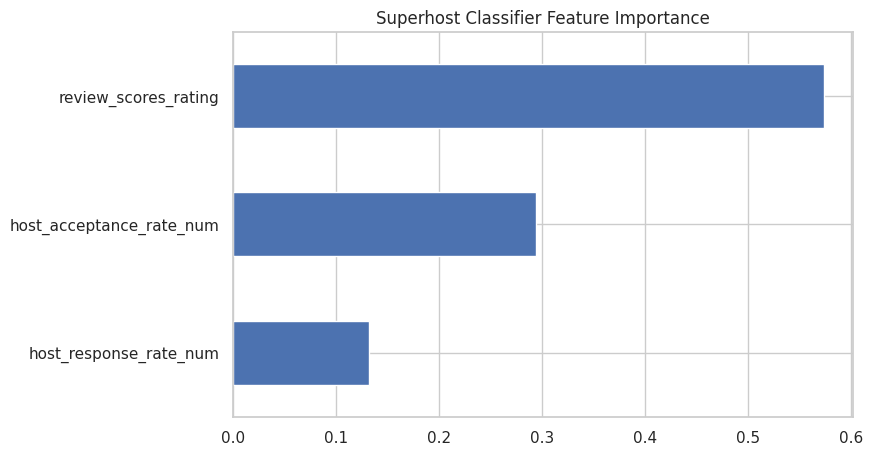

In [21]:
# Superhost classifier feature importance
X_superhost = Melbourne1[['host_response_rate_num', 'host_acceptance_rate_num', 'review_scores_rating']].dropna()
y_superhost = Melbourne1.loc[X_superhost.index]['host_is_superhost']

clf = RandomForestClassifier(random_state=42)
clf.fit(X_superhost, y_superhost)

plt.figure(figsize=(8, 5))
pd.Series(clf.feature_importances_, index=X_superhost.columns).plot(kind='barh')
plt.title('Superhost Classifier Feature Importance')
plt.show()

##Geographic Analysis##

In [22]:
# Interactive map with Folium (price heatmap)
melbourne_map_price = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)
heat_data = [[row['latitude'], row['longitude'], row['price']]
             for _, row in Melbourne1.dropna(subset=['latitude', 'longitude', 'price']).iterrows()]
HeatMap(heat_data).add_to(melbourne_map_price)
print("\n--- Interactive Price Heatmap (displayed below) ---")
display(melbourne_map_price)

# Base map with CBD and top 50 properties by price
melb_map = folium.Map(location=CBD_COORD, zoom_start=12)

folium.Marker(
    CBD_COORD,
    popup='Melbourne CBD',
    icon=folium.Icon(color='red', icon='info-sign')
).add_to(melb_map)

for _, row in Melbourne1.nlargest(50, 'price').iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='blue',
        fill=True,
        popup=f"${row['price']}/night, {row['distance_to_cbd']:.1f}km to CBD"
    ).add_to(melb_map)
print("\n--- Interactive Map with CBD and Top 50 Properties (displayed below) ---")
display(melb_map)



--- Interactive Price Heatmap (displayed below) ---



--- Interactive Map with CBD and Top 50 Properties (displayed below) ---


##Operational Efficiency##

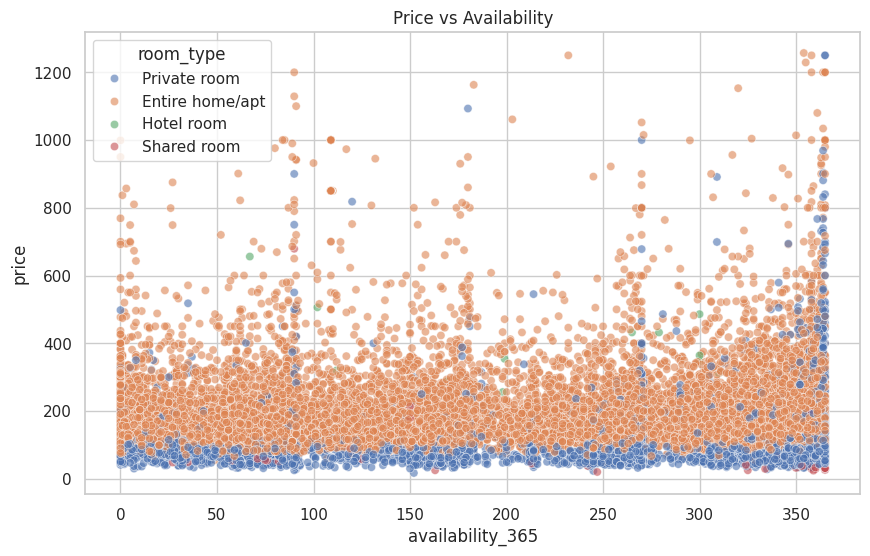

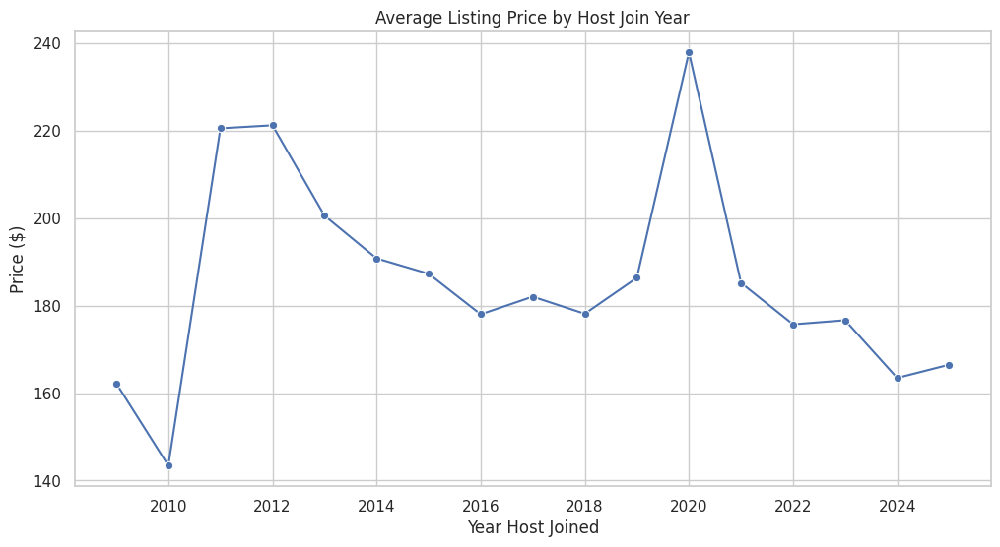

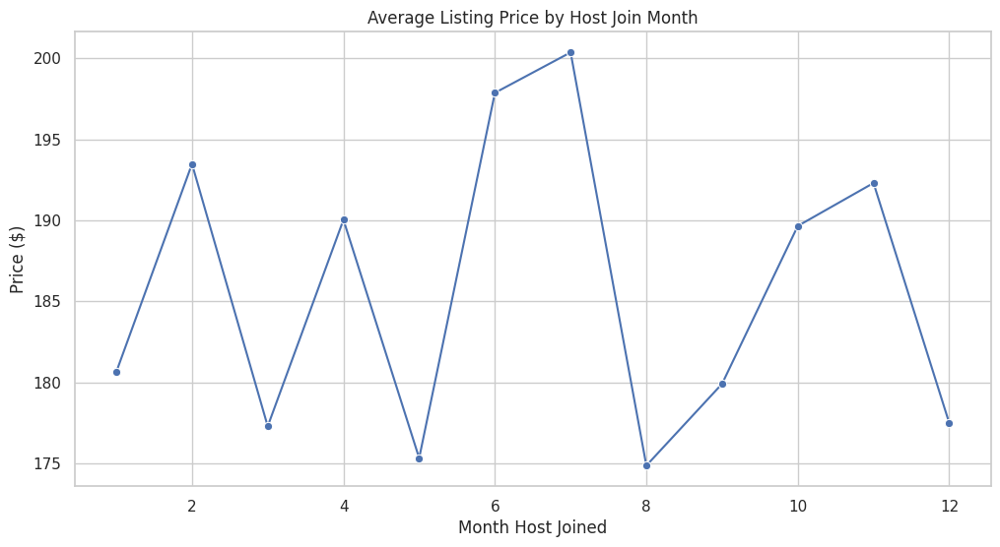

In [23]:
# Occupancy-Price tradeoff
plt.figure(figsize=(10, 6))
sns.scatterplot(x='availability_365', y='price',
                hue='room_type', data=Melbourne1, alpha=0.6)
plt.title('Price vs Availability')
plt.show()

# Average Listing Price by Host Join Year
Melbourne1['host_since_year'] = pd.to_datetime(Melbourne1['host_since']).dt.year
plt.figure(figsize=(12,6))
sns.lineplot(
    x='host_since_year',
    y='price',
    data=Melbourne1,
    estimator='mean',
    errorbar=None,
    marker='o'
)
plt.title('Average Listing Price by Host Join Year')
plt.xlabel('Year Host Joined')
plt.ylabel('Price ($)')
plt.grid(True)
plt.show()

# Average Listing Price by Host Join Month
Melbourne1['host_since_month'] = pd.to_datetime(Melbourne1['host_since']).dt.month
plt.figure(figsize=(12,6))
sns.lineplot(
    x='host_since_month',
    y='price',
    data=Melbourne1,
    estimator='mean',
    errorbar=None,
    marker='o'
)
plt.title('Average Listing Price by Host Join Month')
plt.xlabel('Month Host Joined')
plt.ylabel('Price ($)')
plt.grid(True)
plt.show()


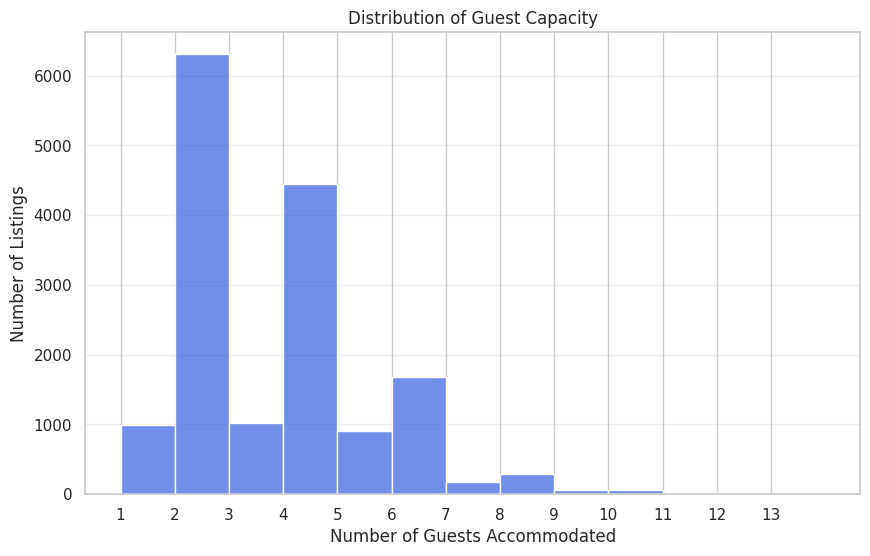

In [24]:
# Distribution of guest capacity
plt.figure(figsize=(10, 6))
sns.histplot(
    data=Melbourne1,
    x='accommodates',
    bins=range(1, int(Melbourne1['accommodates'].max())+2), # Ensure bins cover all integers
    kde=False,
    color='royalblue'
)
plt.title('Distribution of Guest Capacity')
plt.xlabel('Number of Guests Accommodated')
plt.ylabel('Number of Listings')
plt.xticks(range(1, int(Melbourne1['accommodates'].max())+1))
plt.grid(axis='y', alpha=0.3)
plt.show()


##Spatial Analysis##

/usr/local/lib/python3.11/dist-packages/scipy/sparse/_data.py:128: RuntimeWarning:

divide by zero encountered in power

/usr/local/lib/python3.11/dist-packages/libpysal/weights/util.py:826: UserWarning:

The weights matrix is not fully connected: 
 There are 542 disconnected components.
 There are 263 islands with ids: 12, 20, 147, 158, 226, 256, 263, 275, 371, 376, 390, 476, 483, 526, 629, 688, 724, 736, 849, 862, 877, 898, 903, 930, 931, 947, 972, 1096, 1218, 1322, 1349, 1355, 1402, 1480, 1596, 1602, 1609, 1687, 1697, 1718, 1736, 1807, 1821, 1855, 1878, 1907, 2034, 2054, 2113, 2184, 2271, 2311, 2370, 2458, 2500, 2559, 2561, 2577, 2636, 2644, 2649, 2708, 2721, 2743, 2764, 2788, 2810, 2897, 2916, 2917, 2918, 2919, 2975, 3027, 3028, 3138, 3193, 3263, 3291, 3338, 3362, 3374, 3617, 3658, 3706, 3724, 3738, 3760, 3948, 4048, 4063, 4072, 4172, 4180, 4242, 4266, 4275, 4382, 4475, 4569, 4599, 4609, 4626, 4647, 4854, 4866, 4876, 4898, 4969, 5057, 5405, 5522, 5670, 5682, 5804, 5894, 5928, 5935,

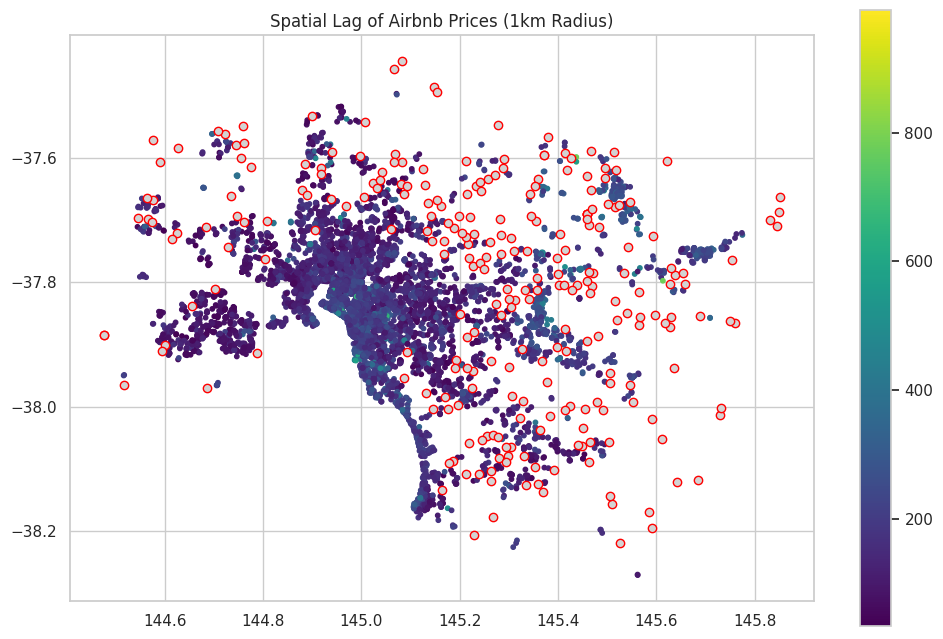


Spatial Lag Statistics:
count    15710.000000
mean       185.129842
std         64.848646
min         33.000000
25%        154.836549
50%        185.924336
75%        211.729976
max        990.907083
Name: price_spatial_lag, dtype: float64


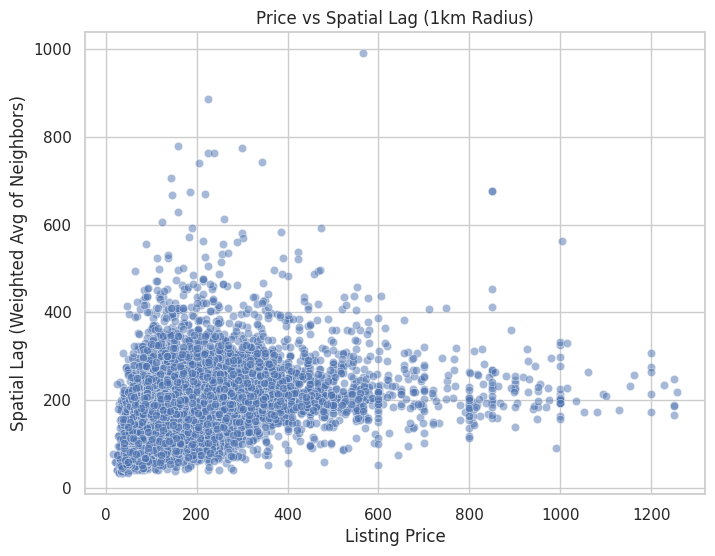

In [25]:
from libpysal.weights import DistanceBand
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import matplotlib.pyplot as plt

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(Melbourne1['longitude'], Melbourne1['latitude'])]
geo_df = gpd.GeoDataFrame(Melbourne1, geometry=geometry, crs="EPSG:4326")

# Calculate spatial lag with decay
def spatial_lag_with_decay(gdf, value_col='price', threshold_km=1):
    """Calculate distance-weighted spatial lag"""
    threshold_deg = threshold_km / 111  # Approximate degrees per km

    # Prepare coordinates and values
    coords = list(zip(gdf['longitude'], gdf['latitude']))
    values = gdf[value_col].values

    # Create distance weights matrix
    try:
        w = DistanceBand(coords,
                        threshold=threshold_deg,
                        binary=False,
                        alpha=-1.5)  # alpha controls distance decay
    except:
        return np.full(len(gdf), np.nan)  # Return NaN if DistanceBand fails

    # Initialize output array
    lag_values = np.zeros(len(values))

    # Calculate weighted averages
    for i in range(len(values)):
        neighbors = w.neighbors[i]
        if neighbors:
            weights = np.array(w.weights[i])
            valid_mask = ~np.isnan(values[neighbors])
            if np.any(valid_mask):
                # Only use non-NaN neighbors
                lag_values[i] = np.sum(values[neighbors][valid_mask] * weights[valid_mask]) / np.sum(weights[valid_mask])
            else:
                lag_values[i] = np.nan
        else:
            lag_values[i] = np.nan

    return lag_values

# Apply spatial lag calculation
valid_price_mask = ~geo_df['price'].isna()
geo_df.loc[valid_price_mask, 'price_spatial_lag'] = spatial_lag_with_decay(
    geo_df[valid_price_mask],
    value_col='price',
    threshold_km=1
)

# Visualize spatial lag
fig, ax = plt.subplots(figsize=(12, 8))
geo_df.plot(
    column='price_spatial_lag',
    cmap='viridis',
    legend=True,
    markersize=10,
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "red",
        "label": "No Data"
    }
)
ax.set_title('Spatial Lag of Airbnb Prices (1km Radius)')
plt.show()

# Show descriptive statistics
print("\nSpatial Lag Statistics:")
print(geo_df['price_spatial_lag'].describe())

# Optional: Plot relationship between price and its spatial lag
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='price',
    y='price_spatial_lag',
    data=geo_df,
    alpha=0.5
)
plt.title('Price vs Spatial Lag (1km Radius)')
plt.xlabel('Listing Price')
plt.ylabel('Spatial Lag (Weighted Avg of Neighbors)')
plt.show()

##Review Analysis##

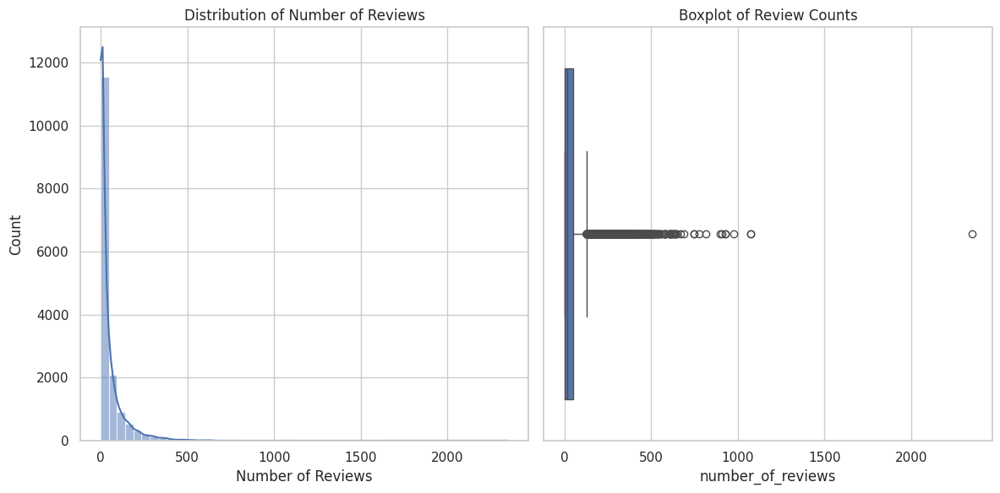


--- Statistical Summary of Number of Reviews ---
count    15973.000000
mean        45.907156
std         80.312865
min          0.000000
25%          3.000000
50%         15.000000
75%         53.000000
max       2350.000000
Name: number_of_reviews, dtype: float64


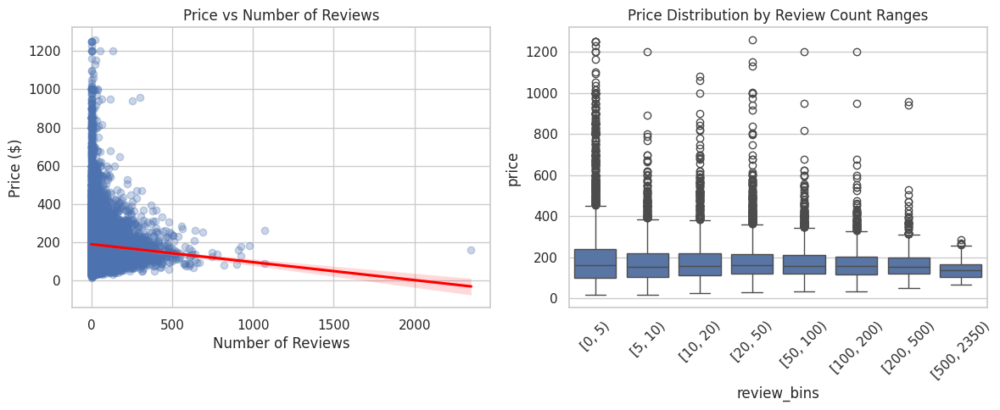

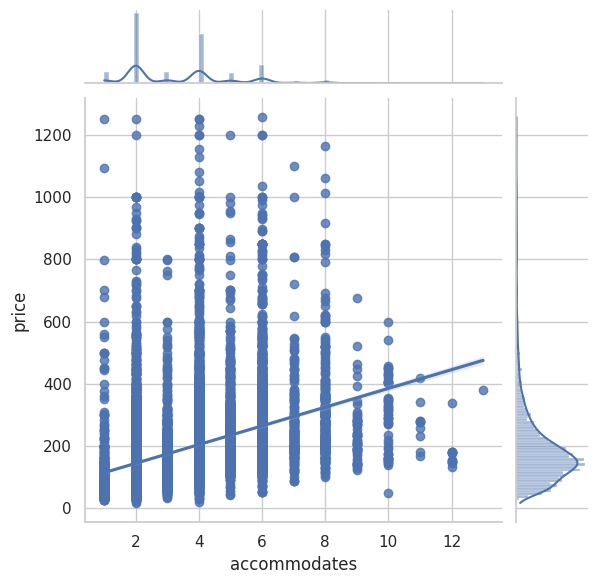

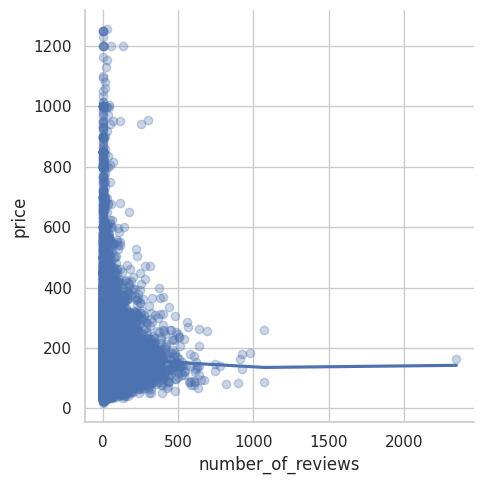

In [26]:
# Distribution of number of reviews
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(Melbourne1['number_of_reviews'], bins=50, kde=True)
plt.title('Distribution of Number of Reviews')
plt.xlabel('Number of Reviews')

plt.subplot(1, 2, 2)
sns.boxplot(x=Melbourne1['number_of_reviews'])
plt.title('Boxplot of Review Counts')
plt.tight_layout()
plt.show()

print("\n--- Statistical Summary of Number of Reviews ---")
print(Melbourne1['number_of_reviews'].describe())

# Price vs Number of Reviews
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.regplot(x='number_of_reviews', y='price',
            data=Melbourne1,
            scatter_kws={'alpha':0.3},
            line_kws={'color':'red'})
plt.title('Price vs Number of Reviews')
plt.xlabel('Number of Reviews')
plt.ylabel('Price ($)')

plt.subplot(1, 2, 2)
bins_reviews = [0, 5, 10, 20, 50, 100, 200, 500, Melbourne1['number_of_reviews'].max()]
Melbourne1['review_bins'] = pd.cut(Melbourne1['number_of_reviews'], bins=bins_reviews, right=False)
sns.boxplot(x='review_bins', y='price', data=Melbourne1)
plt.title('Price Distribution by Review Count Ranges')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Drill down into strong relationships (accommodates vs price)
sns.jointplot(x='accommodates', y='price', data=Melbourne1, kind='reg')
plt.show()

# Check for nonlinear relationship (number_of_reviews vs price)
sns.lmplot(x='number_of_reviews', y='price',
           data=Melbourne1,
           lowess=True,
           scatter_kws={'alpha':0.3})
plt.show()


##Feature Engineering and Selection##

In [27]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.metrics import (r2_score, mean_absolute_error,
                            mean_squared_error, median_absolute_error,
                            explained_variance_score)
from scipy.stats import f_oneway
from sklearn.metrics import (r2_score, mean_absolute_error,
                           mean_squared_error, median_absolute_error,
                           explained_variance_score)
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from statsmodels.api import OLS, add_constant


=== Preparing Base Features ===

=== EVALUATING BASELINE FEATURES ===

Training OLS with Baseline features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.240
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     288.1
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        14:49:03   Log-Likelihood:                -78115.
No. Observations:               12778   AIC:                         1.563e+05
Df Residuals:                   12763   BIC:                         1.564e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------

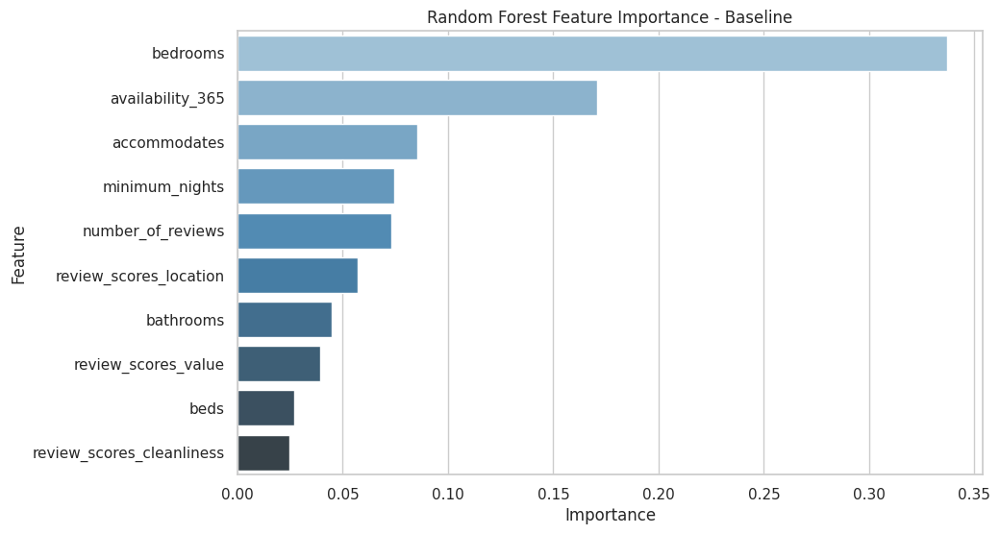


Training XGBoost with Baseline features...


/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




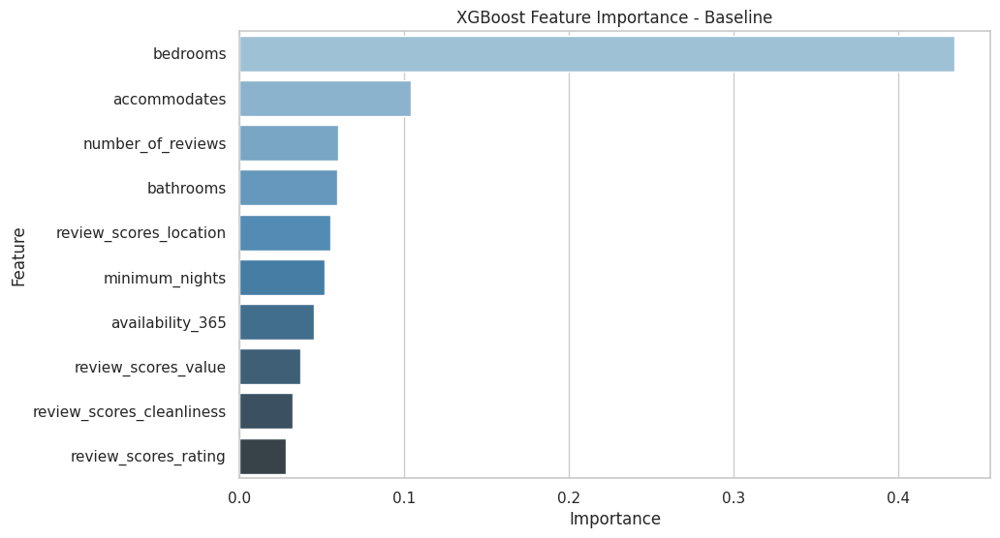


Training SVR with Baseline features...

=== EVALUATING +NEIGHBORHOOD FEATURES ===

Training OLS with +Neighborhood features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.293
Model:                            OLS   Adj. R-squared:                  0.287
Method:                 Least Squares   F-statistic:                     49.03
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        14:50:02   Log-Likelihood:                -77656.
No. Observations:               12778   AIC:                         1.555e+05
Df Residuals:                   12670   BIC:                         1.563e+05
Df Model:                         107                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




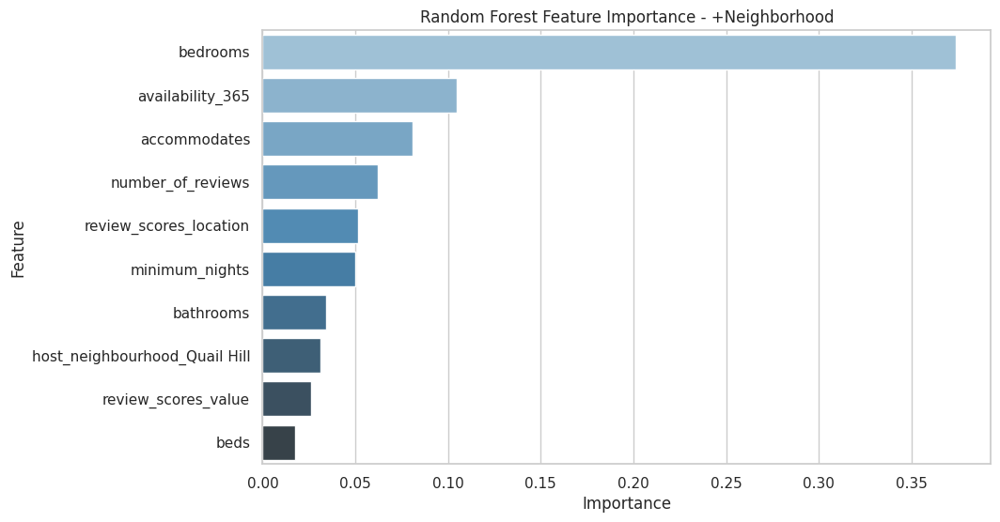


Training XGBoost with +Neighborhood features...


/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




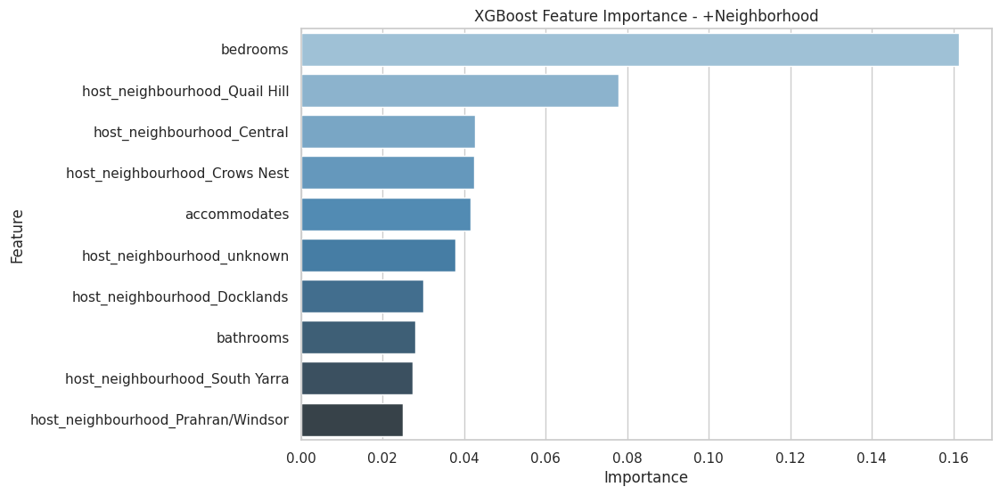


Training SVR with +Neighborhood features...

=== EVALUATING +HOST FEATURES ===

Training OLS with +Host features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     238.7
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        14:51:41   Log-Likelihood:                -78105.
No. Observations:               12778   AIC:                         1.562e+05
Df Residuals:                   12760   BIC:                         1.564e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------

/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




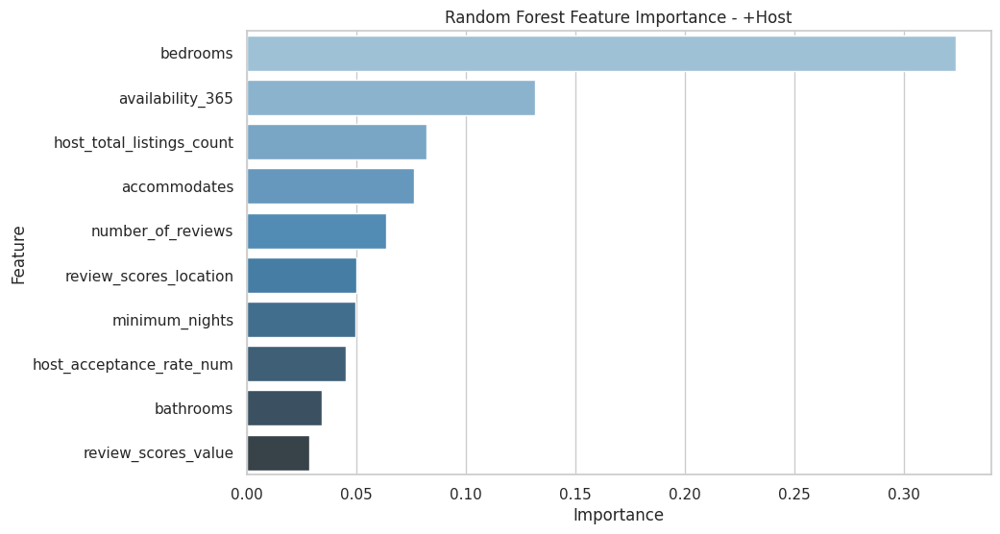


Training XGBoost with +Host features...


/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




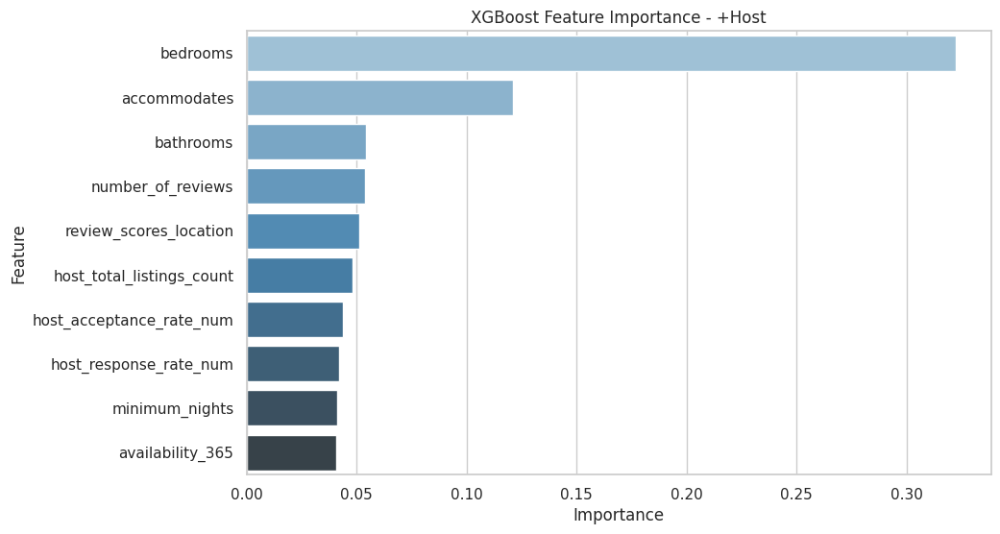


Training SVR with +Host features...

=== EVALUATING +GEOGRAPHIC FEATURES ===

Training OLS with +Geographic features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.258
Method:                 Least Squares   F-statistic:                     262.7
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        14:52:36   Log-Likelihood:                -77952.
No. Observations:               12778   AIC:                         1.559e+05
Df Residuals:                   12760   BIC:                         1.561e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------

/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




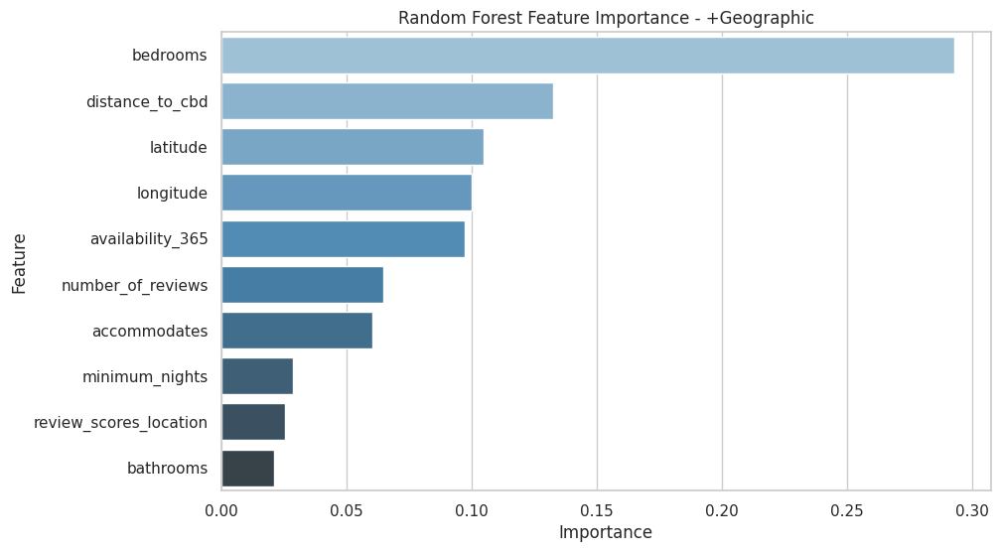


Training XGBoost with +Geographic features...


/tmp/ipython-input-29-1648885113.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




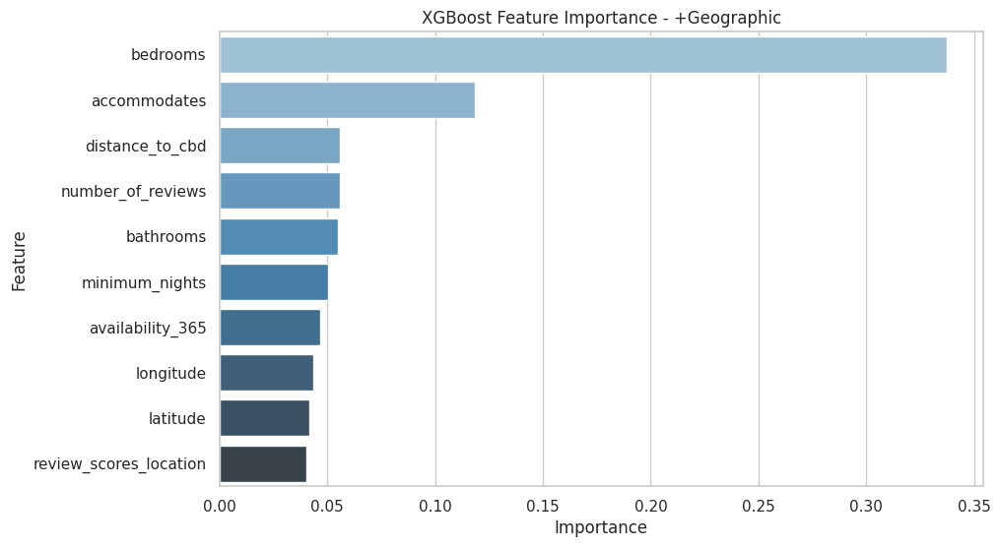


Training SVR with +Geographic features...

=== FINAL MODEL COMPARISON ===
                          Model  Test_R2  Test_Adj_R2  Test_MAE  Test_MSE  \
14          +Geographic XGBoost    0.482        0.479    53.966  7662.921   
10                +Host XGBoost    0.426        0.423    56.818  8499.449   
13    +Geographic Random Forest    0.412        0.409    57.217  8704.588   
6         +Neighborhood XGBoost    0.390        0.368    58.748  9023.077   
2              Baseline XGBoost    0.365        0.363    60.392  9391.662   
9           +Host Random Forest    0.365        0.361    60.197  9401.789   
5   +Neighborhood Random Forest    0.335        0.311    61.317  9839.541   
1        Baseline Random Forest    0.311        0.308    62.551 10195.956   
4             +Neighborhood OLS    0.277        0.251    64.822 10696.902   
12              +Geographic OLS    0.267        0.263    65.168 10844.595   
8                     +Host OLS    0.240        0.236    67.463 11251.807   
0

/tmp/ipython-input-29-1648885113.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-29-1648885113.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-29-1648885113.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




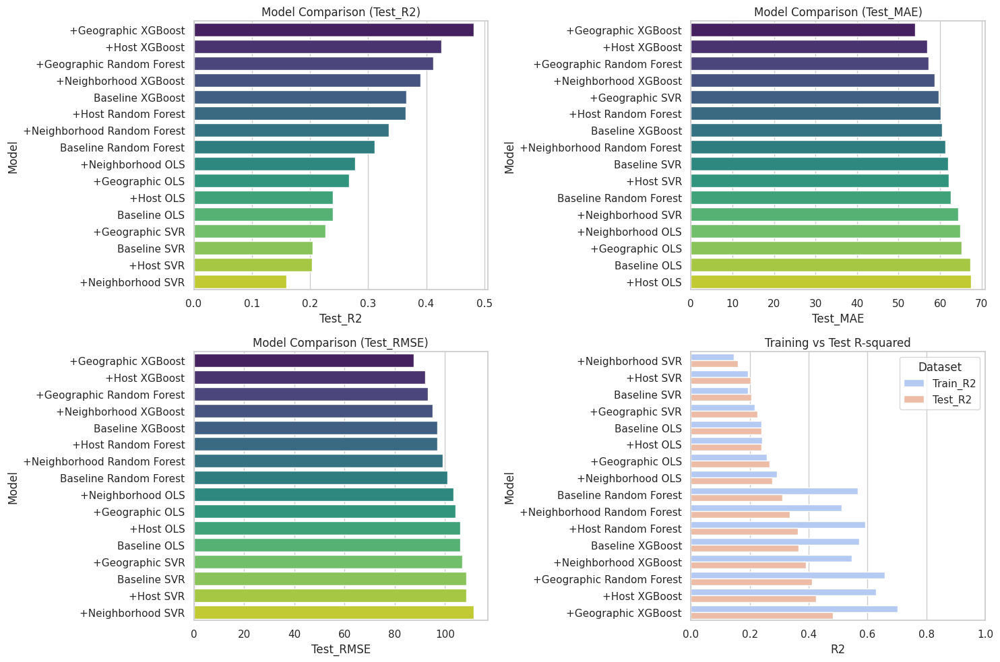


=== PIPELINE COMPLETE ===


In [29]:
# =============================================
# COMPREHENSIVE MODEL EVALUATION PIPELINE
# =============================================

# Initialize results storage
all_results = []

# Define comprehensive evaluation function
def evaluate_model_extended(name, model, X_train, X_test, y_train, y_test):
    """Extended evaluation with training metrics and statistics"""
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate metrics
    results = {
        'Model': name,
        # Training metrics
        'Train_R2': r2_score(y_train, y_train_pred),
        'Train_MAE': mean_absolute_error(y_train, y_train_pred),
        'Train_RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        # Test metrics
        'Test_R2': r2_score(y_test, y_test_pred),
        'Test_MAE': mean_absolute_error(y_test, y_test_pred),
        'Test_RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        # Additional statistics
        'Test_MSE': mean_squared_error(y_test, y_test_pred),
        'Test_MedAE': median_absolute_error(y_test, y_test_pred),
        'Test_Explained_Variance': explained_variance_score(y_test, y_test_pred)
    }

    # Calculate Adjusted R-squared
    n = X_test.shape[0]
    p = X_test.shape[1]
    results['Test_Adj_R2'] = 1 - (1 - results['Test_R2']) * (n - 1) / (n - p - 1)

    return results

def train_and_evaluate_models(X_train, X_test, y_train, y_test, feature_set_name=""):
    """Train and evaluate all model types on given feature set"""
    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    models = {
        'OLS': LinearRegression(),
        'Random Forest': RandomForestRegressor(
            n_estimators=200,
            max_depth=10,
            min_samples_split=5,
            random_state=42
        ),
        'XGBoost': XGBRegressor(
            n_estimators=200,
            max_depth=5,
            learning_rate=0.1,
            random_state=42
        ),
        'SVR': SVR(kernel='rbf', C=1.0, epsilon=0.1)
    }

    for name, model in models.items():
        print(f"\nTraining {name} with {feature_set_name} features...")
        model.fit(X_train_scaled, y_train)

        # Special handling for OLS to get statsmodels summary
        if name == 'OLS':
            X_train_sm = add_constant(X_train_scaled)
            sm_model = OLS(y_train, X_train_sm).fit()
            print(sm_model.summary())

        # Evaluate and store results
        result = evaluate_model_extended(
            f"{feature_set_name} {name}" if feature_set_name else name,
            model,
            X_train_scaled,
            X_test_scaled,
            y_train,
            y_test
        )
        all_results.append(result)

        # Show feature importance for tree-based models
        if name in ['Random Forest', 'XGBoost']:
            importance = pd.DataFrame({
                'Feature': X_train.columns,
                'Importance': model.feature_importances_
            }).sort_values('Importance', ascending=False)

            plt.figure(figsize=(10, 6))
            sns.barplot(x='Importance', y='Feature', data=importance.head(10), palette='Blues_d')
            plt.title(f'{name} Feature Importance - {feature_set_name}')
            plt.show()

# ======================
# MAIN PIPELINE
# ======================

# 1. Prepare base features
print("\n=== Preparing Base Features ===")
num_features_model = [
    col for col in [
        "host_is_superhost", "accommodates", "bathrooms", "bedrooms", "beds",
        "number_of_reviews", "availability_365", "minimum_nights", "review_scores_rating",
        "review_scores_location", "review_scores_cleanliness", "review_scores_checkin",
        "review_scores_communication", "review_scores_value"
    ] if col in Melbourne1.columns
]

X_model = Melbourne1[num_features_model].copy()
y_model = Melbourne1["price"].copy()

# Handle missing values
X_model = X_model.fillna(X_model.median(numeric_only=True))

# 2. Create feature sets
feature_sets = {
    "Baseline": X_model,
    "+Neighborhood": pd.concat([X_model, pd.get_dummies(Melbourne1[['host_neighbourhood']], drop_first=True)], axis=1),
    "+Host": pd.concat([X_model, Melbourne1[['host_response_rate_num', 'host_acceptance_rate_num', 'host_total_listings_count']]], axis=1),
    "+Geographic": pd.concat([X_model, Melbourne1[['latitude', 'longitude', 'distance_to_cbd']]], axis=1)
}

# Add spatial features if available
if 'price_spatial_lag' in Melbourne1.columns:
    feature_sets["+Spatial"] = pd.concat([X_model, Melbourne1[['price_spatial_lag']]], axis=1)

# 3. Train and evaluate models on each feature set
for feature_name, features in feature_sets.items():
    print(f"\n=== EVALUATING {feature_name.upper()} FEATURES ===")
    X_train, X_test, y_train, y_test = train_test_split(
        features, y_model, test_size=0.2, random_state=42
    )
    train_and_evaluate_models(X_train, X_test, y_train, y_test, feature_name)

# 4. Results analysis and visualization
results_comparison = pd.DataFrame(all_results)

# Reorder columns for better readability
metric_cols = ['Test_R2', 'Test_Adj_R2', 'Test_MAE', 'Test_MSE', 'Test_RMSE',
               'Train_R2', 'Train_MAE', 'Train_RMSE', 'Test_Explained_Variance']
results_comparison = results_comparison[['Model'] + metric_cols]

# Format for better display
pd.options.display.float_format = '{:.3f}'.format

print("\n=== FINAL MODEL COMPARISON ===")
print(results_comparison.sort_values('Test_R2', ascending=False))

# Visualization
plt.figure(figsize=(15, 10))

# Model performance comparison
metrics = ['Test_R2', 'Test_MAE', 'Test_RMSE']
for i, metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    sns.barplot(x=metric, y='Model', data=results_comparison.sort_values(metric, ascending=(metric != 'Test_R2')),
                palette='viridis')
    plt.title(f'Model Comparison ({metric})')

# Training vs Test comparison
plt.subplot(2, 2, 4)
melted = results_comparison.melt(id_vars=['Model'],
                               value_vars=['Train_R2', 'Test_R2'],
                               var_name='Dataset',
                               value_name='R2')
sns.barplot(x='R2', y='Model', hue='Dataset', data=melted.sort_values('R2'), palette='coolwarm')
plt.title('Training vs Test R-squared')
plt.xlim(0, 1)

plt.tight_layout()
plt.show()

print("\n=== PIPELINE COMPLETE ===")

##Correlation with Price##

In [30]:
numerical_data_corr = Melbourne1.select_dtypes(include=['int64', 'float64'])
corr_matrix = numerical_data_corr.corr()

print("\n--- Top Features Correlated with Price ---")
price_corr = corr_matrix[['price']].sort_values('price', ascending=False)
print(price_corr)


--- Top Features Correlated with Price ---
                                     price
price                                1.000
bedrooms                             0.425
accommodates                         0.420
beds                                 0.358
bathrooms                            0.318
listings_within_5km                  0.144
review_scores_location               0.100
instant_bookable                     0.099
listings_within_2km                  0.088
longitude                            0.087
availability_365                     0.082
maximum_nights                       0.076
review_scores_cleanliness            0.060
host_tenure                          0.053
host_total_listings_count            0.051
review_scores_rating                 0.049
listings_within_1km                  0.049
host_acceptance_rate_num             0.046
host_acceptance_rate                 0.046
review_scores_accuracy               0.044
distance_to_melbourne_airport        0.044
host_respo

##PCA Principal Component Analysis##

Explained variance ratio: [0.32837308 0.21171155 0.08776115 0.07084826 0.07007865 0.05208384
 0.04507651 0.03717865 0.02949466 0.01828637]
Total variance explained: 0.950892721194261

Component Loadings:
                               PC1    PC2    PC3    PC4    PC5    PC6    PC7  \
host_is_superhost            0.146  0.025  0.619  0.152  0.107  0.700 -0.148   
accommodates                -0.009  0.541  0.028 -0.010  0.006 -0.078 -0.211   
bathrooms                    0.008  0.399 -0.076  0.018 -0.010  0.210  0.868   
bedrooms                     0.007  0.523 -0.051 -0.003 -0.002  0.021 -0.123   
beds                        -0.007  0.521  0.019  0.003  0.022 -0.095 -0.325   
number_of_reviews            0.071  0.018  0.701  0.172  0.169 -0.616  0.216   
availability_365            -0.045 -0.014 -0.229  0.130  0.961  0.018 -0.010   
minimum_nights               0.004 -0.007 -0.196  0.964 -0.177 -0.014 -0.031   
review_scores_rating         0.439 -0.001 -0.059 -0.011  0.011  0.026  0.031

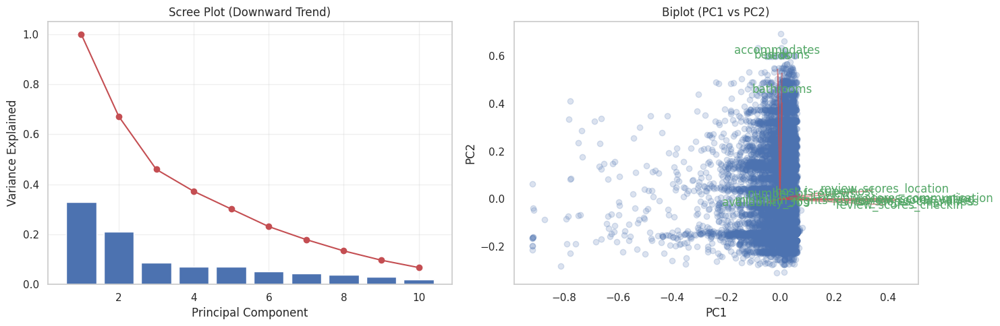


Components needed for:
80% variance: PC6
90% variance: PC8
95% variance: PC10


In [31]:
# Select and prepare features
features = [
       "host_is_superhost", "accommodates", "bathrooms", "bedrooms", "beds",
        "number_of_reviews", "availability_365", "minimum_nights", "review_scores_rating",
        "review_scores_location", "review_scores_cleanliness", "review_scores_checkin",
        "review_scores_communication", "review_scores_value"
]

X = Melbourne1[features].fillna(Melbourne1[features].median())

# Create and fit pipeline
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('reducer', PCA(n_components=0.95))  # Keep 95% variance
])

pipe.fit(X)  # Fit the complete pipeline

# Get PCA results
pca = pipe.named_steps['reducer']
principal_components = pca.transform(pipe.named_steps['scaler'].transform(X))

# Create results DataFrame
pca_df = pd.DataFrame(
    data=principal_components,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]
)

# Variance analysis
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total variance explained:", sum(pca.explained_variance_ratio_))

# Component loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=features
)
print("\nComponent Loadings:")
print(loadings)

# Visualization
plt.figure(figsize=(15, 5))

# Scree plot (modified to connect points properly)
plt.subplot(1, 2, 1)
bars = plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

# Calculate cumulative variance points that connect to bar tops
cumulative_points = [1]  # Start at 100%
for i in range(len(pca.explained_variance_ratio_)):
    cumulative_points.append(cumulative_points[-1] - pca.explained_variance_ratio_[i])

# Plot connecting line
plt.plot(range(1, len(cumulative_points)), cumulative_points[:-1], 'ro-')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Scree Plot (Downward Trend)')
plt.grid(alpha=0.3)

# Biplot
plt.subplot(1, 2, 2)
xs = principal_components[:,0]
ys = principal_components[:,1]
scalex = 1.0/(xs.max() - xs.min())
scaley = 1.0/(ys.max() - ys.min())

plt.scatter(xs * scalex, ys * scaley, alpha=0.2)

for i in range(len(features)):
    plt.arrow(0, 0, pca.components_[0,i], pca.components_[1,i],
              color='r', alpha=0.5)
    plt.text(pca.components_[0,i]*1.15, pca.components_[1,i]*1.15,
             features[i], color='g', ha='center', va='center')

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title('Biplot (PC1 vs PC2)')
plt.grid()
plt.tight_layout()
plt.show()

# Numerical summary
print(f"\nComponents needed for:")
print(f"80% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.80).argmax() + 1}")
print(f"90% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.90).argmax() + 1}")
print(f"95% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.95).argmax() + 1}")

##Model Interpretability##


--- Permutation Importance ---
                      Feature  Importance   Std
16            distance_to_cbd       9.760 0.502
1                accommodates       9.298 0.302
3                    bedrooms       8.394 0.266
6            availability_365       4.097 0.310
15                  longitude       3.620 0.201
14                   latitude       2.943 0.217
5           number_of_reviews       2.093 0.237
13        review_scores_value       1.814 0.180
8        review_scores_rating       1.248 0.197
10  review_scores_cleanliness       1.193 0.154

Creating PDP for: ['distance_to_cbd', 'accommodates', 'bedrooms', 'availability_365']


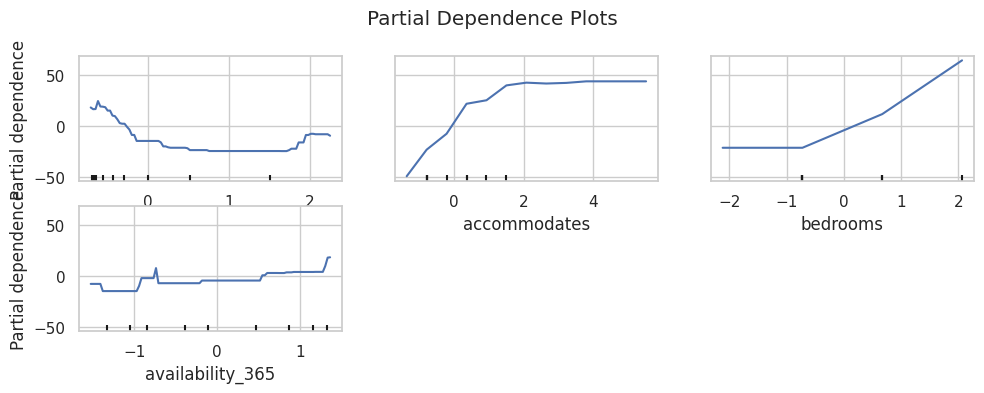


SHAP explanations skipped due to large dataset size (>1000 samples)

--- LIME Explanations ---

LIME Explanation for Instance 0:
[('accommodates <= -0.80', -54.33955122878255), ('bedrooms <= -0.72', -44.45652534985186), ('distance_to_cbd > 0.24', -30.021875754658716), ('availability_365 > 1.04', 18.99318073614911), ('bathrooms <= -0.57', -17.190288091676596)]

LIME Explanation for Instance 1597:
[('accommodates <= -0.80', -53.761475540589196), ('bedrooms <= -0.72', -45.291785164551555), ('distance_to_cbd > 0.24', -29.916815247935627), ('longitude <= -0.37', -20.73265787242859), ('bathrooms <= -0.57', -16.97628869425672)]

LIME Explanation for Instance -1:
[('accommodates <= -0.80', -54.75568161046766), ('bedrooms <= -0.72', -46.26794146261497), ('latitude <= -0.31', 20.86765486144421), ('bathrooms <= -0.57', -18.326515057089708), ('-0.43 < distance_to_cbd <= 0.24', -16.058539775655834)]


In [33]:
X_train_interpret = X_train
X_test_interpret = X_test
scaler_interpret = StandardScaler()
X_train_scaled_interpret = scaler_interpret.fit_transform(X_train_interpret)
X_test_scaled_interpret = scaler_interpret.transform(X_test_interpret)

# Gradient Boosting Model for Interpretability
gbm_model_interpret = GradientBoostingRegressor(random_state=42)
gbm_model_interpret.fit(X_train_scaled_interpret, y_train)

# Store the trained model and data for interpretability
interpretability_data = {
    'model': gbm_model_interpret,
    'X_train': X_train_interpret,
    'X_test': X_test_interpret,
    'X_train_scaled': X_train_scaled_interpret,
    'X_test_scaled': X_test_scaled_interpret,
    'y_train': y_train,
    'y_test': y_test,
    'feature_names': X_train_interpret.columns.tolist()
}

# Permutation Importance
result_perm_imp = permutation_importance(
    gbm_model_interpret,
    X_test_scaled_interpret,
    y_test,
    n_repeats=10,
    random_state=123,
    scoring='neg_mean_absolute_error'
)

perm_importance_df = pd.DataFrame({
    'Feature': interpretability_data['feature_names'],
    'Importance': result_perm_imp.importances_mean,
    'Std': result_perm_imp.importances_std
}).sort_values('Importance', ascending=False)

print("\n--- Permutation Importance ---")
print(perm_importance_df.head(10))

# Partial Dependence Plots (PDP)
top_features_pdp = perm_importance_df['Feature'].head(4).tolist()
print(f"\nCreating PDP for: {top_features_pdp}")

fig, ax = plt.subplots(figsize=(10, 4))
PartialDependenceDisplay.from_estimator(
    gbm_model_interpret,
    X_train_scaled_interpret,
    features=top_features_pdp,
    feature_names=interpretability_data['feature_names'],
    kind='average',
    ax=ax
)
plt.suptitle('Partial Dependence Plots')
plt.tight_layout()
plt.show()

# SHAP Explanations (only calculate if dataset isn't too large)
if len(X_test_interpret) <= 1000:  # Limit for reasonable computation time
    print("\n--- SHAP Explanations ---")
    explainer_shap = shap.TreeExplainer(gbm_model_interpret)
    shap_values = explainer_shap.shap_values(X_test_scaled_interpret)

    print("\nSHAP Summary Plot:")
    shap.summary_plot(shap_values, X_test_scaled_interpret,
                     feature_names=interpretability_data['feature_names'])

    print(f"\nSHAP Dependence Plot for {top_features_pdp[0]}:")
    shap.dependence_plot(
        top_features_pdp[0],
        shap_values,
        X_test_scaled_interpret,
        feature_names=interpretability_data['feature_names']
    )
else:
    print("\nSHAP explanations skipped due to large dataset size (>1000 samples)")

# LIME Explanations (for a few representative samples)
print("\n--- LIME Explanations ---")
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled_interpret,
    feature_names=interpretability_data['feature_names'],
    mode='regression',
    verbose=False,
    random_state=42
)

# Explain 3 representative instances
for i in [0, len(X_test_interpret)//2, -1]:  # First, middle, last sample
    print(f"\nLIME Explanation for Instance {i}:")
    exp = explainer_lime.explain_instance(
        data_row=X_test_scaled_interpret[i],
        predict_fn=gbm_model_interpret.predict,
        num_features=5
    )
    # For Jupyter Notebook:
    # exp.show_in_notebook(show_all=False)

    # For script output:
    print(exp.as_list())

In [54]:
Melbourne1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15973 entries, 0 to 25945
Data columns (total 57 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   id                                   15973 non-null  int64         
 1   name                                 15973 non-null  object        
 2   host_id                              15973 non-null  int64         
 3   host_name                            15973 non-null  object        
 4   host_since                           15973 non-null  datetime64[ns]
 5   host_is_superhost                    15973 non-null  float64       
 6   neighbourhood                        15973 non-null  object        
 7   host_neighbourhood                   15973 non-null  object        
 8   host_total_listings_count            15973 non-null  float64       
 9   latitude                             15973 non-null  float64       
 10  longitude      


--- ANOVA for Price Differences by Room Type ---
F-statistic: 676.3, p-value: 0.000e+00

--- Correlation of Review Scores with Price ---
review_scores_value      -0.002
review_scores_location    0.100
price                     1.000
Name: price, dtype: float64


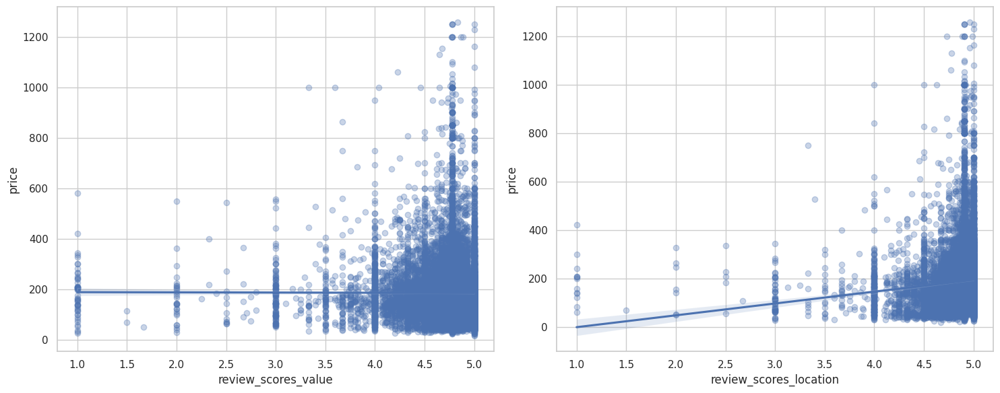

In [34]:
# ANOVA for room types
print("\n--- ANOVA for Price Differences by Room Type ---")
groups_room_type = [group['price'].values
                    for name, group in Melbourne1.groupby('room_type')]
f_stat_room, p_value_room = f_oneway(*groups_room_type)
print(f"F-statistic: {f_stat_room:.1f}, p-value: {p_value_room:.3e}")

# Correlation of review scores with price
review_corrs = Melbourne1[['price', 'review_scores_value', 'review_scores_location']].corr()
print("\n--- Correlation of Review Scores with Price ---")
print(review_corrs['price'].sort_values())

# Visual investigation of review scores vs price
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.regplot(x='review_scores_value', y='price', data=Melbourne1, ax=ax[0], scatter_kws={'alpha':0.3})
sns.regplot(x='review_scores_location', y='price', data=Melbourne1, ax=ax[1], scatter_kws={'alpha':0.3})
plt.tight_layout()
plt.show()